# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


In [2]:
!pip install -U matplotlib==2.0.2
!pip install -U tensorflow-gpu==1.3.0

Requirement already up-to-date: matplotlib==2.0.2 in /opt/conda/lib/python3.6/site-packages
Requirement already up-to-date: pytz in /opt/conda/lib/python3.6/site-packages (from matplotlib==2.0.2)
Requirement already up-to-date: pyparsing!=2.0.0,!=2.0.4,!=2.1.2,!=2.1.6,>=1.5.6 in /opt/conda/lib/python3.6/site-packages (from matplotlib==2.0.2)
Requirement already up-to-date: python-dateutil in /opt/conda/lib/python3.6/site-packages (from matplotlib==2.0.2)
Requirement already up-to-date: six>=1.10 in /opt/conda/lib/python3.6/site-packages (from matplotlib==2.0.2)
Requirement already up-to-date: cycler>=0.10 in /opt/conda/lib/python3.6/site-packages/cycler-0.10.0-py3.6.egg (from matplotlib==2.0.2)
Requirement already up-to-date: numpy>=1.7.1 in /opt/conda/lib/python3.6/site-packages (from matplotlib==2.0.2)
You are using pip version 9.0.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Requirement already up-to-date: tensorf

## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

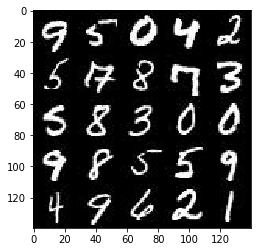

In [3]:
show_n_images = 25


%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

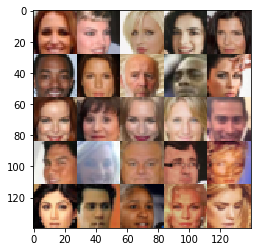

In [4]:
show_n_images = 25


mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='Real_Input')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='Z_input')
    Learning_Rate = tf.placeholder(tf.float32, name='Learning_Rate')
    return input_real, input_z, Learning_Rate



tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 478, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'File "/opt/co

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        layer1 = tf.layers.conv2d(images, 56, 5, strides=2, padding='same')
        layer1 = tf.maximum(alpha * layer1, layer1)
        
        
        layer2 = tf.layers.conv2d(layer1, 112, 5, strides=2, padding='same')
        layer2 = tf.layers.batch_normalization(layer2, training=True)
        layer2 = tf.maximum(alpha * layer2, layer2)
        layer2 = tf.layers.dropout(layer2, 0.3)
        
        layer3 = tf.layers.conv2d(layer2, 224, 5, strides=2, padding='same')
        layer3 = tf.layers.batch_normalization(layer3, training=True)
        layer3 = tf.maximum(alpha * layer3, layer3)
        layer3 = tf.layers.dropout(layer3, 0.3)
        
        flatten = tf.reshape(layer3, (-1, 4*4*224))
        logits = tf.layers.dense(flatten, 1)
        output = tf.sigmoid(logits)
        
        return output, logits



tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        
        layer1 = tf.layers.dense(z, 3*3*448)
        
        layer1 = tf.reshape(layer1, (-1, 3, 3, 448))
        layer1 = tf.layers.batch_normalization(layer1, training=is_train)
        layer1 = tf.maximum(alpha * layer1, layer1)
        
        
        layer2 = tf.layers.conv2d_transpose(layer1, 224, 5, strides=1, padding='valid')
        layer2 = tf.layers.batch_normalization(layer2, training=is_train)
        layer2 = tf.maximum(alpha * layer2, layer2)
        
        
        layer3 = tf.layers.conv2d_transpose(layer2, 112, 5, strides=2, padding='same')
        layer3 = tf.layers.batch_normalization(layer3, training=is_train)
        layer3 = tf.maximum(alpha * layer3, layer3)
                
        
        logits = tf.layers.conv2d_transpose(layer3, out_channel_dim, 5, strides=2, padding='same')
                
        output = tf.tanh(logits)
        
        return output    



tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    smooth = 0.1
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    g_model = generator(input_z, out_channel_dim, is_train=True)    
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)* (1 - smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss



tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
     
    all_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_update_ops = [var for var in all_update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in all_update_ops if var.name.startswith('discriminator')]
    with tf.control_dependencies(d_update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(g_update_ops):    
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        
    return d_train_opt, g_train_opt


tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    input_real, input_z, input_learning_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z,  data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, input_learning_rate:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_learning_rate:learning_rate})
                if steps % 20 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("epoch {}/{}... steps:{} ".format(epoch_i+1, epochs, steps),
                          "discriminator_loss: {:.4f}...".format(train_loss_d),
                          "generator_loss: {:.4f}".format(train_loss_g))
                    
                if steps % 100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
        print("final discriminator_loss: {:.4f}...".format(train_loss_d),
                          "generator_oss: {:.4f}".format(train_loss_g))
        show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode) 

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

epoch 1/2... steps:20  discriminator_loss: 4.2310... generator_loss: 0.0267
epoch 1/2... steps:40  discriminator_loss: 2.3086... generator_loss: 0.1778
epoch 1/2... steps:60  discriminator_loss: 1.4288... generator_loss: 0.5131
epoch 1/2... steps:80  discriminator_loss: 1.6308... generator_loss: 0.3699
epoch 1/2... steps:100  discriminator_loss: 1.5910... generator_loss: 0.3827


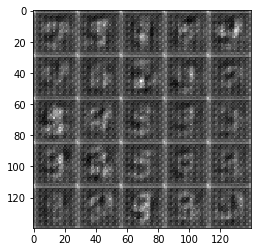

epoch 1/2... steps:120  discriminator_loss: 1.4456... generator_loss: 1.3039
epoch 1/2... steps:140  discriminator_loss: 1.2526... generator_loss: 0.6751
epoch 1/2... steps:160  discriminator_loss: 1.4835... generator_loss: 0.4773
epoch 1/2... steps:180  discriminator_loss: 1.3118... generator_loss: 0.5285
epoch 1/2... steps:200  discriminator_loss: 1.2877... generator_loss: 0.5302


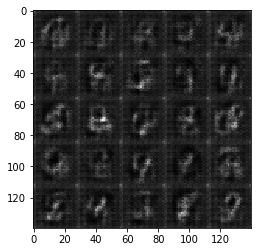

epoch 1/2... steps:220  discriminator_loss: 1.3773... generator_loss: 0.4737
epoch 1/2... steps:240  discriminator_loss: 1.2314... generator_loss: 1.2085
epoch 1/2... steps:260  discriminator_loss: 1.2044... generator_loss: 1.7774
epoch 1/2... steps:280  discriminator_loss: 1.2345... generator_loss: 1.2319
epoch 1/2... steps:300  discriminator_loss: 1.2710... generator_loss: 1.4536


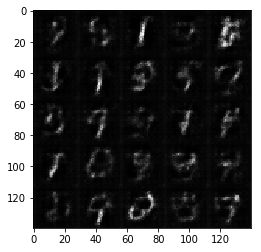

epoch 1/2... steps:320  discriminator_loss: 1.0764... generator_loss: 0.9540
epoch 1/2... steps:340  discriminator_loss: 1.1874... generator_loss: 0.8702
epoch 1/2... steps:360  discriminator_loss: 1.4479... generator_loss: 0.5090
epoch 1/2... steps:380  discriminator_loss: 1.3643... generator_loss: 1.7160
epoch 1/2... steps:400  discriminator_loss: 1.1882... generator_loss: 0.7207


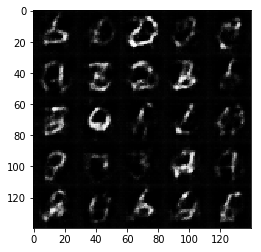

epoch 1/2... steps:420  discriminator_loss: 1.1923... generator_loss: 0.7310
epoch 1/2... steps:440  discriminator_loss: 1.3917... generator_loss: 0.5040
epoch 1/2... steps:460  discriminator_loss: 1.3612... generator_loss: 0.5309
epoch 1/2... steps:480  discriminator_loss: 1.0141... generator_loss: 1.3827
epoch 1/2... steps:500  discriminator_loss: 1.3295... generator_loss: 0.5271


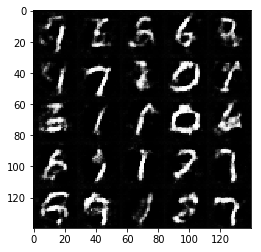

epoch 1/2... steps:520  discriminator_loss: 0.9695... generator_loss: 1.5458
epoch 1/2... steps:540  discriminator_loss: 1.4587... generator_loss: 0.4671
epoch 1/2... steps:560  discriminator_loss: 1.1740... generator_loss: 1.7934
epoch 1/2... steps:580  discriminator_loss: 1.3509... generator_loss: 0.5180
epoch 1/2... steps:600  discriminator_loss: 1.1278... generator_loss: 0.9387


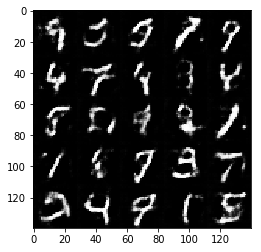

epoch 1/2... steps:620  discriminator_loss: 1.1830... generator_loss: 1.2224
epoch 1/2... steps:640  discriminator_loss: 1.2198... generator_loss: 0.6127
epoch 1/2... steps:660  discriminator_loss: 1.2719... generator_loss: 0.6528
epoch 1/2... steps:680  discriminator_loss: 1.5122... generator_loss: 0.3912
epoch 1/2... steps:700  discriminator_loss: 1.0731... generator_loss: 0.8424


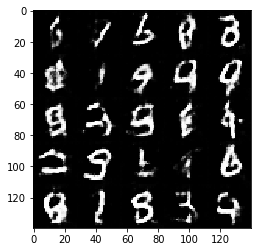

epoch 1/2... steps:720  discriminator_loss: 1.2255... generator_loss: 0.6424
epoch 1/2... steps:740  discriminator_loss: 1.1244... generator_loss: 0.7519
epoch 1/2... steps:760  discriminator_loss: 1.0972... generator_loss: 0.7835
epoch 1/2... steps:780  discriminator_loss: 1.1711... generator_loss: 0.6990
epoch 1/2... steps:800  discriminator_loss: 1.0944... generator_loss: 0.7458


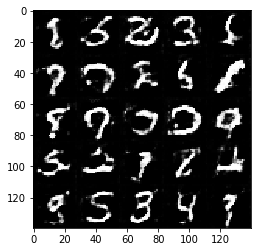

epoch 1/2... steps:820  discriminator_loss: 2.1160... generator_loss: 0.1983
epoch 1/2... steps:840  discriminator_loss: 1.1481... generator_loss: 0.7704
epoch 1/2... steps:860  discriminator_loss: 1.3453... generator_loss: 0.5489
epoch 1/2... steps:880  discriminator_loss: 1.3692... generator_loss: 1.9946
epoch 1/2... steps:900  discriminator_loss: 1.0345... generator_loss: 1.0021


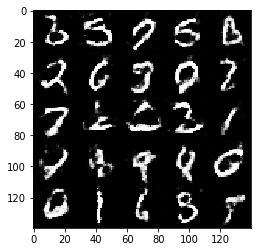

epoch 1/2... steps:920  discriminator_loss: 1.0412... generator_loss: 0.8867
epoch 1/2... steps:940  discriminator_loss: 1.3235... generator_loss: 0.5018
epoch 1/2... steps:960  discriminator_loss: 1.0112... generator_loss: 1.0061
epoch 1/2... steps:980  discriminator_loss: 1.1636... generator_loss: 0.7273
epoch 1/2... steps:1000  discriminator_loss: 1.0474... generator_loss: 1.1257


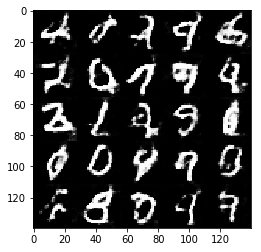

epoch 1/2... steps:1020  discriminator_loss: 1.5041... generator_loss: 0.4020
epoch 1/2... steps:1040  discriminator_loss: 0.9992... generator_loss: 1.1553
epoch 1/2... steps:1060  discriminator_loss: 1.2272... generator_loss: 0.6218
epoch 1/2... steps:1080  discriminator_loss: 1.0765... generator_loss: 0.9428
epoch 1/2... steps:1100  discriminator_loss: 1.1772... generator_loss: 0.6599


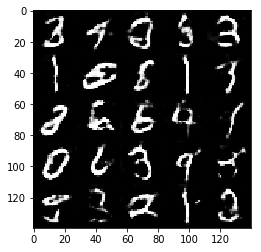

epoch 1/2... steps:1120  discriminator_loss: 1.2692... generator_loss: 0.5424
epoch 1/2... steps:1140  discriminator_loss: 1.2424... generator_loss: 0.5510
epoch 1/2... steps:1160  discriminator_loss: 1.2492... generator_loss: 0.5776
epoch 1/2... steps:1180  discriminator_loss: 1.0673... generator_loss: 0.8178
epoch 1/2... steps:1200  discriminator_loss: 0.9615... generator_loss: 1.5319


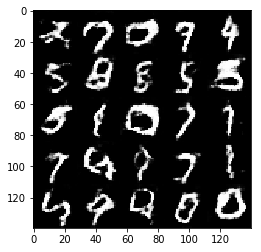

epoch 1/2... steps:1220  discriminator_loss: 1.1748... generator_loss: 0.6629
epoch 1/2... steps:1240  discriminator_loss: 1.1501... generator_loss: 1.7060
epoch 1/2... steps:1260  discriminator_loss: 1.0479... generator_loss: 1.6824
epoch 1/2... steps:1280  discriminator_loss: 0.7570... generator_loss: 1.2771
epoch 1/2... steps:1300  discriminator_loss: 1.6387... generator_loss: 0.3357


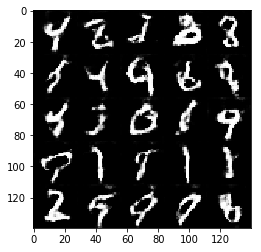

epoch 1/2... steps:1320  discriminator_loss: 1.3215... generator_loss: 0.5861
epoch 1/2... steps:1340  discriminator_loss: 1.9242... generator_loss: 0.2572
epoch 1/2... steps:1360  discriminator_loss: 1.0969... generator_loss: 1.8769
epoch 1/2... steps:1380  discriminator_loss: 0.9790... generator_loss: 0.9034
epoch 1/2... steps:1400  discriminator_loss: 1.9682... generator_loss: 0.2391


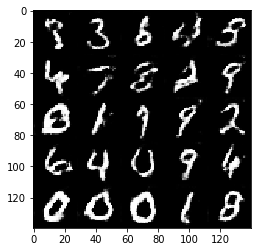

epoch 1/2... steps:1420  discriminator_loss: 1.0723... generator_loss: 1.6692
epoch 1/2... steps:1440  discriminator_loss: 0.9765... generator_loss: 0.9916
epoch 1/2... steps:1460  discriminator_loss: 0.8300... generator_loss: 1.6674
epoch 1/2... steps:1480  discriminator_loss: 1.1356... generator_loss: 0.6919
epoch 1/2... steps:1500  discriminator_loss: 0.9489... generator_loss: 1.2863


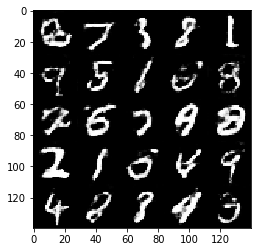

epoch 1/2... steps:1520  discriminator_loss: 1.1858... generator_loss: 0.6367
epoch 1/2... steps:1540  discriminator_loss: 0.8647... generator_loss: 1.2236
epoch 1/2... steps:1560  discriminator_loss: 2.4860... generator_loss: 4.0786
epoch 1/2... steps:1580  discriminator_loss: 1.0607... generator_loss: 0.7438
epoch 1/2... steps:1600  discriminator_loss: 1.0078... generator_loss: 0.8192


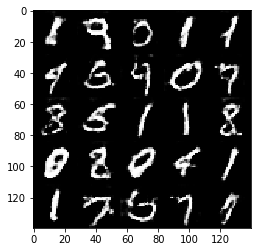

epoch 1/2... steps:1620  discriminator_loss: 0.7781... generator_loss: 1.2086
epoch 1/2... steps:1640  discriminator_loss: 0.7355... generator_loss: 1.4803
epoch 1/2... steps:1660  discriminator_loss: 0.8508... generator_loss: 1.2861
epoch 1/2... steps:1680  discriminator_loss: 0.9447... generator_loss: 1.7436
epoch 1/2... steps:1700  discriminator_loss: 1.3500... generator_loss: 2.5285


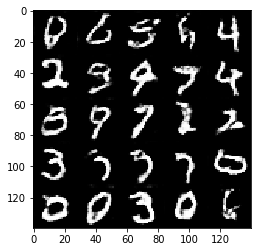

epoch 1/2... steps:1720  discriminator_loss: 0.7423... generator_loss: 1.3352
epoch 1/2... steps:1740  discriminator_loss: 0.9573... generator_loss: 0.8272
epoch 1/2... steps:1760  discriminator_loss: 0.7415... generator_loss: 1.3090
epoch 1/2... steps:1780  discriminator_loss: 1.1070... generator_loss: 0.6794
epoch 1/2... steps:1800  discriminator_loss: 3.1736... generator_loss: 3.8668


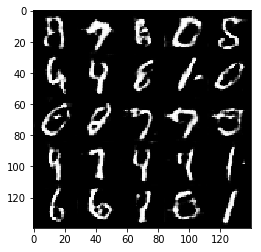

epoch 1/2... steps:1820  discriminator_loss: 0.8603... generator_loss: 0.9501
epoch 1/2... steps:1840  discriminator_loss: 2.0642... generator_loss: 0.2850
epoch 1/2... steps:1860  discriminator_loss: 0.7813... generator_loss: 1.2817
epoch 1/2... steps:1880  discriminator_loss: 0.9207... generator_loss: 0.9972
epoch 1/2... steps:1900  discriminator_loss: 0.8858... generator_loss: 1.2916


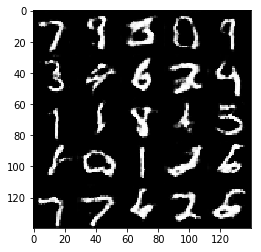

epoch 1/2... steps:1920  discriminator_loss: 0.6918... generator_loss: 2.4170
epoch 1/2... steps:1940  discriminator_loss: 0.8853... generator_loss: 1.0630
epoch 1/2... steps:1960  discriminator_loss: 0.8187... generator_loss: 1.1136
epoch 1/2... steps:1980  discriminator_loss: 0.9452... generator_loss: 0.8428
epoch 1/2... steps:2000  discriminator_loss: 0.7908... generator_loss: 1.0715


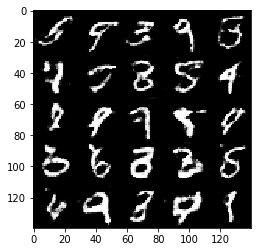

epoch 1/2... steps:2020  discriminator_loss: 0.7195... generator_loss: 1.4749
epoch 1/2... steps:2040  discriminator_loss: 0.9035... generator_loss: 1.9474
epoch 1/2... steps:2060  discriminator_loss: 0.7296... generator_loss: 1.2268
epoch 1/2... steps:2080  discriminator_loss: 1.0169... generator_loss: 0.8446
epoch 1/2... steps:2100  discriminator_loss: 0.7655... generator_loss: 1.9641


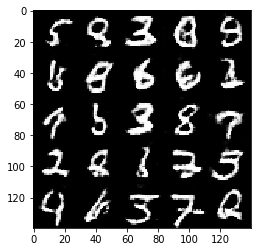

epoch 1/2... steps:2120  discriminator_loss: 0.6955... generator_loss: 1.7932
epoch 1/2... steps:2140  discriminator_loss: 1.5643... generator_loss: 0.4276
epoch 1/2... steps:2160  discriminator_loss: 0.9028... generator_loss: 1.3200
epoch 1/2... steps:2180  discriminator_loss: 1.0207... generator_loss: 0.9122
epoch 1/2... steps:2200  discriminator_loss: 1.0777... generator_loss: 0.7970


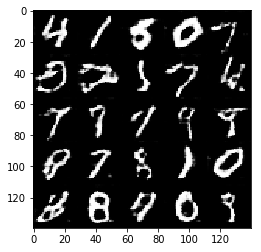

epoch 1/2... steps:2220  discriminator_loss: 1.1168... generator_loss: 0.7533
epoch 1/2... steps:2240  discriminator_loss: 0.6594... generator_loss: 1.9706
epoch 1/2... steps:2260  discriminator_loss: 0.9629... generator_loss: 2.0649
epoch 1/2... steps:2280  discriminator_loss: 0.7690... generator_loss: 1.3202
epoch 1/2... steps:2300  discriminator_loss: 1.2123... generator_loss: 2.8062


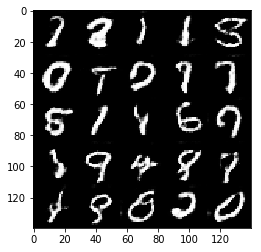

epoch 1/2... steps:2320  discriminator_loss: 1.6715... generator_loss: 0.3883
epoch 1/2... steps:2340  discriminator_loss: 0.8245... generator_loss: 1.1707
epoch 1/2... steps:2360  discriminator_loss: 0.8210... generator_loss: 1.0839
epoch 1/2... steps:2380  discriminator_loss: 0.6569... generator_loss: 1.6725
epoch 1/2... steps:2400  discriminator_loss: 0.9577... generator_loss: 2.3601


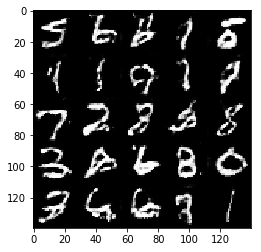

epoch 1/2... steps:2420  discriminator_loss: 1.3082... generator_loss: 0.6673
epoch 1/2... steps:2440  discriminator_loss: 0.8264... generator_loss: 1.2275
epoch 1/2... steps:2460  discriminator_loss: 1.2791... generator_loss: 0.6022
epoch 1/2... steps:2480  discriminator_loss: 0.7452... generator_loss: 2.0992
epoch 1/2... steps:2500  discriminator_loss: 0.6439... generator_loss: 1.6217


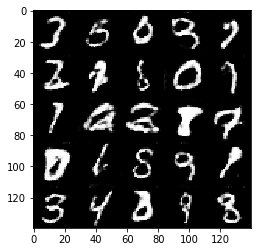

epoch 1/2... steps:2520  discriminator_loss: 0.7220... generator_loss: 1.2091
epoch 1/2... steps:2540  discriminator_loss: 0.8917... generator_loss: 1.0904
epoch 1/2... steps:2560  discriminator_loss: 1.2326... generator_loss: 0.6605
epoch 1/2... steps:2580  discriminator_loss: 0.5921... generator_loss: 1.5631
epoch 1/2... steps:2600  discriminator_loss: 0.6269... generator_loss: 1.9816


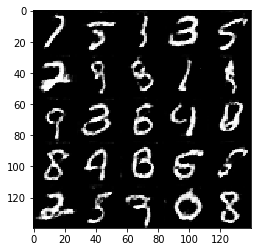

epoch 1/2... steps:2620  discriminator_loss: 0.7246... generator_loss: 1.2874
epoch 1/2... steps:2640  discriminator_loss: 1.1171... generator_loss: 0.7117
epoch 1/2... steps:2660  discriminator_loss: 0.7593... generator_loss: 1.3294
epoch 1/2... steps:2680  discriminator_loss: 0.7698... generator_loss: 2.8194
epoch 1/2... steps:2700  discriminator_loss: 0.9735... generator_loss: 0.8972


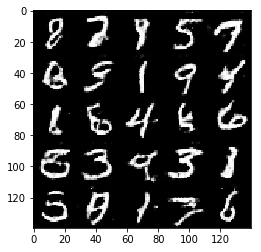

epoch 1/2... steps:2720  discriminator_loss: 0.8895... generator_loss: 2.0892
epoch 1/2... steps:2740  discriminator_loss: 0.9565... generator_loss: 0.8867
epoch 1/2... steps:2760  discriminator_loss: 0.7611... generator_loss: 1.7727
epoch 1/2... steps:2780  discriminator_loss: 0.7150... generator_loss: 1.3614
epoch 1/2... steps:2800  discriminator_loss: 1.1807... generator_loss: 0.6419


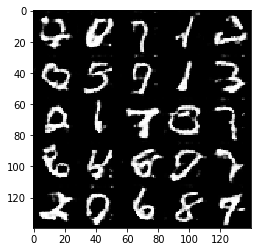

epoch 1/2... steps:2820  discriminator_loss: 1.0793... generator_loss: 0.7627
epoch 1/2... steps:2840  discriminator_loss: 0.9128... generator_loss: 0.9484
epoch 1/2... steps:2860  discriminator_loss: 1.2168... generator_loss: 3.3928
epoch 1/2... steps:2880  discriminator_loss: 0.8679... generator_loss: 1.0104
epoch 1/2... steps:2900  discriminator_loss: 0.5621... generator_loss: 1.9356


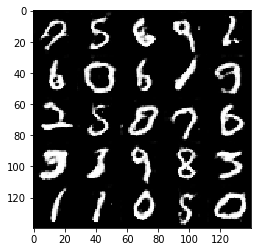

epoch 1/2... steps:2920  discriminator_loss: 1.6733... generator_loss: 4.0622
epoch 1/2... steps:2940  discriminator_loss: 0.7928... generator_loss: 1.1891
epoch 1/2... steps:2960  discriminator_loss: 0.6894... generator_loss: 2.2282
epoch 1/2... steps:2980  discriminator_loss: 0.8020... generator_loss: 1.1566
epoch 1/2... steps:3000  discriminator_loss: 0.9128... generator_loss: 2.5406


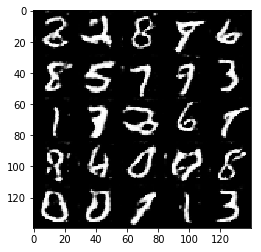

epoch 2/2... steps:3020  discriminator_loss: 0.7074... generator_loss: 1.9645
epoch 2/2... steps:3040  discriminator_loss: 0.6838... generator_loss: 1.4717
epoch 2/2... steps:3060  discriminator_loss: 0.6113... generator_loss: 1.7080
epoch 2/2... steps:3080  discriminator_loss: 1.1003... generator_loss: 0.7704
epoch 2/2... steps:3100  discriminator_loss: 0.7736... generator_loss: 1.1667


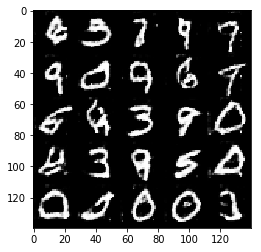

epoch 2/2... steps:3120  discriminator_loss: 1.6440... generator_loss: 0.4330
epoch 2/2... steps:3140  discriminator_loss: 0.6385... generator_loss: 1.5926
epoch 2/2... steps:3160  discriminator_loss: 0.9844... generator_loss: 0.8815
epoch 2/2... steps:3180  discriminator_loss: 0.9165... generator_loss: 0.9933
epoch 2/2... steps:3200  discriminator_loss: 0.8421... generator_loss: 1.9278


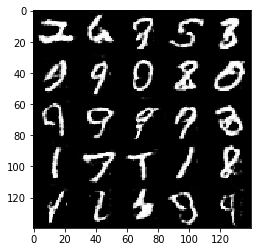

epoch 2/2... steps:3220  discriminator_loss: 0.6095... generator_loss: 1.8578
epoch 2/2... steps:3240  discriminator_loss: 0.7054... generator_loss: 1.4205
epoch 2/2... steps:3260  discriminator_loss: 1.1093... generator_loss: 0.7495
epoch 2/2... steps:3280  discriminator_loss: 0.6366... generator_loss: 1.5097
epoch 2/2... steps:3300  discriminator_loss: 0.9449... generator_loss: 2.5153


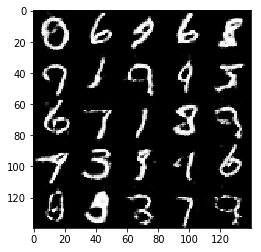

epoch 2/2... steps:3320  discriminator_loss: 0.9254... generator_loss: 0.9809
epoch 2/2... steps:3340  discriminator_loss: 0.6925... generator_loss: 1.4012
epoch 2/2... steps:3360  discriminator_loss: 0.5714... generator_loss: 1.7942
epoch 2/2... steps:3380  discriminator_loss: 1.0167... generator_loss: 2.5340
epoch 2/2... steps:3400  discriminator_loss: 0.6147... generator_loss: 1.6173


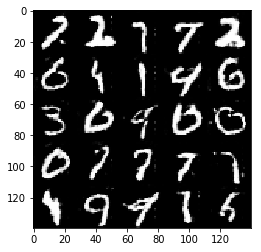

epoch 2/2... steps:3420  discriminator_loss: 0.7375... generator_loss: 1.2623
epoch 2/2... steps:3440  discriminator_loss: 0.8890... generator_loss: 2.5041
epoch 2/2... steps:3460  discriminator_loss: 0.6832... generator_loss: 1.3355
epoch 2/2... steps:3480  discriminator_loss: 0.5539... generator_loss: 1.8207
epoch 2/2... steps:3500  discriminator_loss: 0.5942... generator_loss: 2.0898


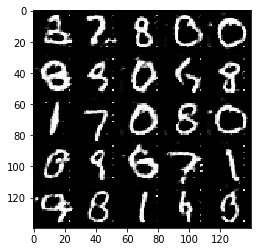

epoch 2/2... steps:3520  discriminator_loss: 1.8817... generator_loss: 4.9393
epoch 2/2... steps:3540  discriminator_loss: 0.7815... generator_loss: 1.3083
epoch 2/2... steps:3560  discriminator_loss: 0.6505... generator_loss: 1.5879
epoch 2/2... steps:3580  discriminator_loss: 1.1363... generator_loss: 0.7526
epoch 2/2... steps:3600  discriminator_loss: 0.5705... generator_loss: 2.2308


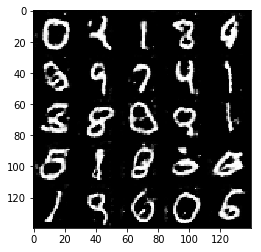

epoch 2/2... steps:3620  discriminator_loss: 0.5690... generator_loss: 1.8294
epoch 2/2... steps:3640  discriminator_loss: 0.9196... generator_loss: 2.8861
epoch 2/2... steps:3660  discriminator_loss: 0.9207... generator_loss: 0.9043
epoch 2/2... steps:3680  discriminator_loss: 1.1699... generator_loss: 0.7002
epoch 2/2... steps:3700  discriminator_loss: 0.8178... generator_loss: 1.1123


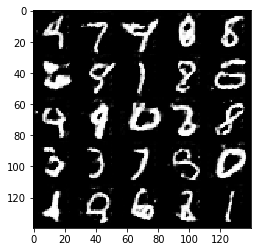

epoch 2/2... steps:3720  discriminator_loss: 0.8044... generator_loss: 1.1187
epoch 2/2... steps:3740  discriminator_loss: 0.6567... generator_loss: 1.4150
epoch 2/2... steps:3760  discriminator_loss: 1.6893... generator_loss: 0.5104
epoch 2/2... steps:3780  discriminator_loss: 0.7342... generator_loss: 1.4743
epoch 2/2... steps:3800  discriminator_loss: 0.5510... generator_loss: 1.8952


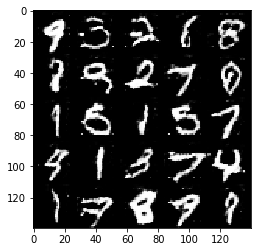

epoch 2/2... steps:3820  discriminator_loss: 0.9325... generator_loss: 1.0066
epoch 2/2... steps:3840  discriminator_loss: 1.3572... generator_loss: 0.6275
epoch 2/2... steps:3860  discriminator_loss: 0.7454... generator_loss: 1.6178
epoch 2/2... steps:3880  discriminator_loss: 0.6467... generator_loss: 1.5018
epoch 2/2... steps:3900  discriminator_loss: 1.8217... generator_loss: 0.3894


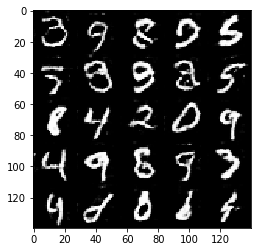

epoch 2/2... steps:3920  discriminator_loss: 0.4988... generator_loss: 3.5461
epoch 2/2... steps:3940  discriminator_loss: 1.5162... generator_loss: 0.4803
epoch 2/2... steps:3960  discriminator_loss: 0.6066... generator_loss: 1.6632
epoch 2/2... steps:3980  discriminator_loss: 0.7948... generator_loss: 1.2249
epoch 2/2... steps:4000  discriminator_loss: 0.6753... generator_loss: 1.3523


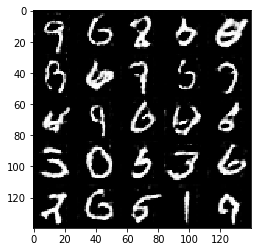

epoch 2/2... steps:4020  discriminator_loss: 1.2157... generator_loss: 0.7378
epoch 2/2... steps:4040  discriminator_loss: 0.6244... generator_loss: 2.0957
epoch 2/2... steps:4060  discriminator_loss: 0.5506... generator_loss: 1.8274
epoch 2/2... steps:4080  discriminator_loss: 0.6961... generator_loss: 2.1782
epoch 2/2... steps:4100  discriminator_loss: 0.7418... generator_loss: 1.2905


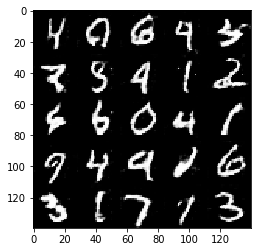

epoch 2/2... steps:4120  discriminator_loss: 0.7427... generator_loss: 1.2815
epoch 2/2... steps:4140  discriminator_loss: 1.2133... generator_loss: 0.7777
epoch 2/2... steps:4160  discriminator_loss: 0.6153... generator_loss: 1.4917
epoch 2/2... steps:4180  discriminator_loss: 0.8555... generator_loss: 1.1416
epoch 2/2... steps:4200  discriminator_loss: 0.8309... generator_loss: 2.1088


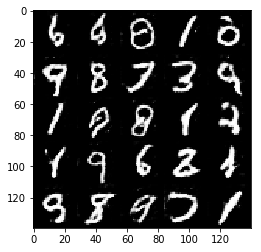

epoch 2/2... steps:4220  discriminator_loss: 0.7156... generator_loss: 1.2842
epoch 2/2... steps:4240  discriminator_loss: 0.6386... generator_loss: 1.4582
epoch 2/2... steps:4260  discriminator_loss: 0.7662... generator_loss: 2.1075
epoch 2/2... steps:4280  discriminator_loss: 1.2019... generator_loss: 4.0359
epoch 2/2... steps:4300  discriminator_loss: 1.2264... generator_loss: 0.6161


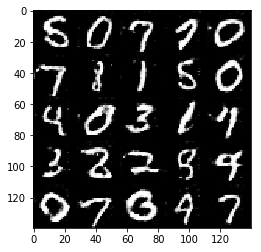

epoch 2/2... steps:4320  discriminator_loss: 0.6112... generator_loss: 1.5983
epoch 2/2... steps:4340  discriminator_loss: 1.0512... generator_loss: 0.7908
epoch 2/2... steps:4360  discriminator_loss: 1.2468... generator_loss: 0.6530
epoch 2/2... steps:4380  discriminator_loss: 1.0193... generator_loss: 0.8303
epoch 2/2... steps:4400  discriminator_loss: 2.3133... generator_loss: 0.3189


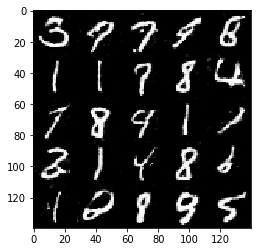

epoch 2/2... steps:4420  discriminator_loss: 0.5232... generator_loss: 2.2315
epoch 2/2... steps:4440  discriminator_loss: 1.0683... generator_loss: 0.8145
epoch 2/2... steps:4460  discriminator_loss: 0.7242... generator_loss: 1.2608
epoch 2/2... steps:4480  discriminator_loss: 0.7287... generator_loss: 1.3173
epoch 2/2... steps:4500  discriminator_loss: 0.6107... generator_loss: 1.6561


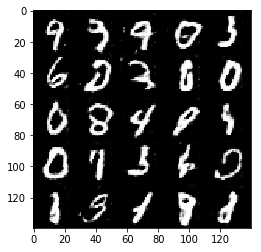

epoch 2/2... steps:4520  discriminator_loss: 0.8371... generator_loss: 1.1557
epoch 2/2... steps:4540  discriminator_loss: 0.8702... generator_loss: 1.0448
epoch 2/2... steps:4560  discriminator_loss: 0.6353... generator_loss: 2.6265
epoch 2/2... steps:4580  discriminator_loss: 0.9782... generator_loss: 1.0778
epoch 2/2... steps:4600  discriminator_loss: 1.4533... generator_loss: 0.6252


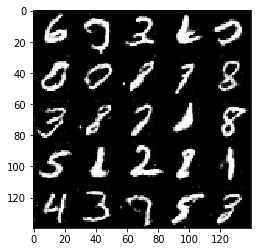

epoch 2/2... steps:4620  discriminator_loss: 0.9014... generator_loss: 1.0022
epoch 2/2... steps:4640  discriminator_loss: 0.5789... generator_loss: 2.3342
epoch 2/2... steps:4660  discriminator_loss: 0.6147... generator_loss: 1.5825
epoch 2/2... steps:4680  discriminator_loss: 2.6316... generator_loss: 0.1831
epoch 2/2... steps:4700  discriminator_loss: 0.6893... generator_loss: 2.2494


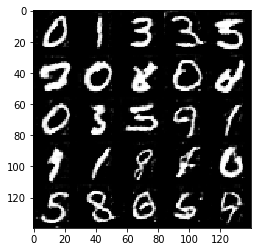

epoch 2/2... steps:4720  discriminator_loss: 1.0814... generator_loss: 3.5442
epoch 2/2... steps:4740  discriminator_loss: 0.5978... generator_loss: 1.8058
epoch 2/2... steps:4760  discriminator_loss: 0.7858... generator_loss: 1.1418
epoch 2/2... steps:4780  discriminator_loss: 0.7265... generator_loss: 1.3111
epoch 2/2... steps:4800  discriminator_loss: 1.7996... generator_loss: 5.7129


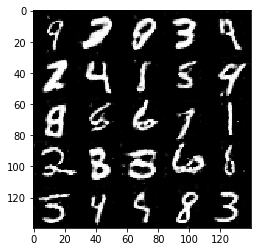

epoch 2/2... steps:4820  discriminator_loss: 0.7103... generator_loss: 1.4444
epoch 2/2... steps:4840  discriminator_loss: 0.7224... generator_loss: 1.5253
epoch 2/2... steps:4860  discriminator_loss: 0.6265... generator_loss: 1.4947
epoch 2/2... steps:4880  discriminator_loss: 0.4537... generator_loss: 2.5254
epoch 2/2... steps:4900  discriminator_loss: 0.6471... generator_loss: 1.8186


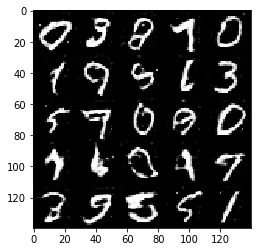

epoch 2/2... steps:4920  discriminator_loss: 0.6200... generator_loss: 1.8636
epoch 2/2... steps:4940  discriminator_loss: 0.9444... generator_loss: 0.9591
epoch 2/2... steps:4960  discriminator_loss: 0.5022... generator_loss: 2.3691
epoch 2/2... steps:4980  discriminator_loss: 0.6633... generator_loss: 1.5485
epoch 2/2... steps:5000  discriminator_loss: 0.6072... generator_loss: 1.6060


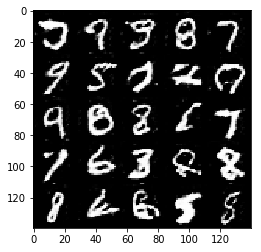

epoch 2/2... steps:5020  discriminator_loss: 0.5699... generator_loss: 2.4231
epoch 2/2... steps:5040  discriminator_loss: 0.6060... generator_loss: 1.6669
epoch 2/2... steps:5060  discriminator_loss: 1.6319... generator_loss: 0.6394
epoch 2/2... steps:5080  discriminator_loss: 0.7779... generator_loss: 1.2102
epoch 2/2... steps:5100  discriminator_loss: 0.8260... generator_loss: 1.6107


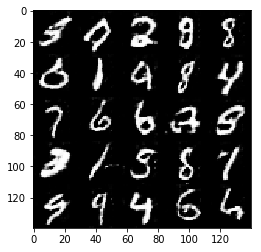

epoch 2/2... steps:5120  discriminator_loss: 0.9270... generator_loss: 0.9244
epoch 2/2... steps:5140  discriminator_loss: 0.5577... generator_loss: 1.8822
epoch 2/2... steps:5160  discriminator_loss: 0.5398... generator_loss: 1.9074
epoch 2/2... steps:5180  discriminator_loss: 0.6270... generator_loss: 1.5011
epoch 2/2... steps:5200  discriminator_loss: 0.4319... generator_loss: 2.5665


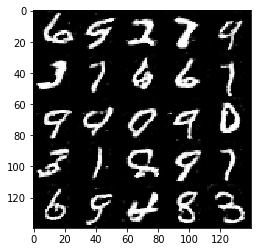

epoch 2/2... steps:5220  discriminator_loss: 0.6737... generator_loss: 1.6321
epoch 2/2... steps:5240  discriminator_loss: 0.5621... generator_loss: 2.0274
epoch 2/2... steps:5260  discriminator_loss: 0.5389... generator_loss: 1.8046
epoch 2/2... steps:5280  discriminator_loss: 1.5796... generator_loss: 4.3735
epoch 2/2... steps:5300  discriminator_loss: 0.7119... generator_loss: 1.3037


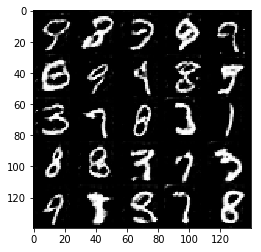

epoch 2/2... steps:5320  discriminator_loss: 0.6155... generator_loss: 1.6535
epoch 2/2... steps:5340  discriminator_loss: 0.6306... generator_loss: 1.5663
epoch 2/2... steps:5360  discriminator_loss: 0.5328... generator_loss: 2.0312
epoch 2/2... steps:5380  discriminator_loss: 0.4856... generator_loss: 2.1354
epoch 2/2... steps:5400  discriminator_loss: 0.6359... generator_loss: 1.7625


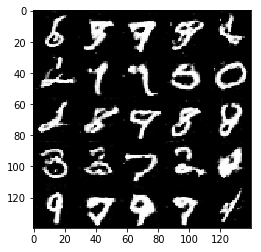

epoch 2/2... steps:5420  discriminator_loss: 1.0489... generator_loss: 0.8357
epoch 2/2... steps:5440  discriminator_loss: 1.8113... generator_loss: 0.5529
epoch 2/2... steps:5460  discriminator_loss: 1.0382... generator_loss: 0.9019
epoch 2/2... steps:5480  discriminator_loss: 1.1923... generator_loss: 0.7436
epoch 2/2... steps:5500  discriminator_loss: 1.0333... generator_loss: 3.2255


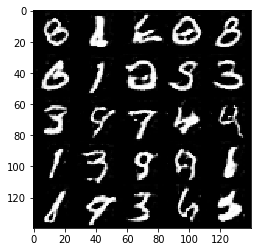

epoch 2/2... steps:5520  discriminator_loss: 0.6050... generator_loss: 1.6705
epoch 2/2... steps:5540  discriminator_loss: 0.5739... generator_loss: 1.7810
epoch 2/2... steps:5560  discriminator_loss: 1.0864... generator_loss: 4.1982
epoch 2/2... steps:5580  discriminator_loss: 0.7524... generator_loss: 1.2786
epoch 2/2... steps:5600  discriminator_loss: 0.6511... generator_loss: 1.6018


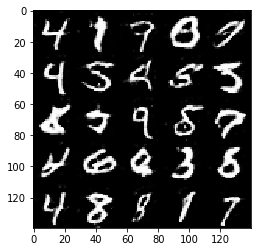

epoch 2/2... steps:5620  discriminator_loss: 0.6016... generator_loss: 2.4662
epoch 2/2... steps:5640  discriminator_loss: 1.3713... generator_loss: 0.5580
epoch 2/2... steps:5660  discriminator_loss: 0.5601... generator_loss: 1.8068
epoch 2/2... steps:5680  discriminator_loss: 0.6501... generator_loss: 1.4652
epoch 2/2... steps:5700  discriminator_loss: 0.7208... generator_loss: 1.8365


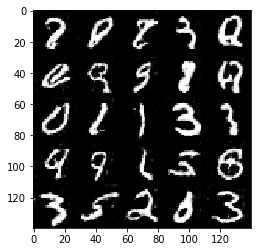

epoch 2/2... steps:5720  discriminator_loss: 0.6033... generator_loss: 1.8424
epoch 2/2... steps:5740  discriminator_loss: 0.7524... generator_loss: 1.2943
epoch 2/2... steps:5760  discriminator_loss: 2.9428... generator_loss: 0.1755
epoch 2/2... steps:5780  discriminator_loss: 1.0316... generator_loss: 0.9342
epoch 2/2... steps:5800  discriminator_loss: 0.5974... generator_loss: 2.0043


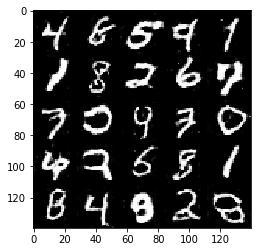

epoch 2/2... steps:5820  discriminator_loss: 1.2618... generator_loss: 0.6922
epoch 2/2... steps:5840  discriminator_loss: 0.8374... generator_loss: 1.1261
epoch 2/2... steps:5860  discriminator_loss: 0.5124... generator_loss: 2.1213
epoch 2/2... steps:5880  discriminator_loss: 0.7064... generator_loss: 2.6536
epoch 2/2... steps:5900  discriminator_loss: 0.5817... generator_loss: 1.8096


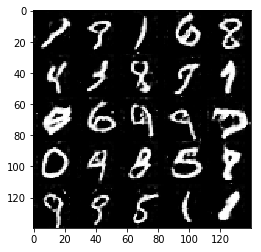

epoch 2/2... steps:5920  discriminator_loss: 0.6503... generator_loss: 1.5196
epoch 2/2... steps:5940  discriminator_loss: 1.0942... generator_loss: 0.9778
epoch 2/2... steps:5960  discriminator_loss: 0.5881... generator_loss: 1.9615
epoch 2/2... steps:5980  discriminator_loss: 0.4977... generator_loss: 2.3096
epoch 2/2... steps:6000  discriminator_loss: 0.9152... generator_loss: 1.0273


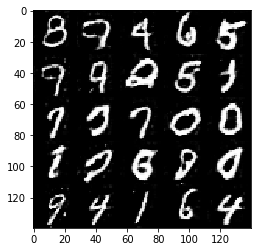

final discriminator_loss: 0.9152... generator_oss: 1.0273


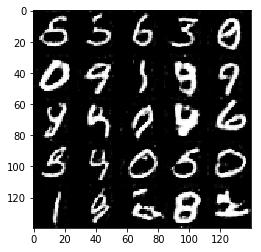

In [13]:
batch_size = 20
z_dim = 20
learning_rate = 0.0004
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

epoch 1/1... steps:20  discriminator_loss: 1.6842... generator_loss: 4.2745
epoch 1/1... steps:40  discriminator_loss: 1.7566... generator_loss: 2.2372
epoch 1/1... steps:60  discriminator_loss: 1.9186... generator_loss: 2.6347
epoch 1/1... steps:80  discriminator_loss: 1.3836... generator_loss: 0.7398
epoch 1/1... steps:100  discriminator_loss: 1.7381... generator_loss: 1.7408


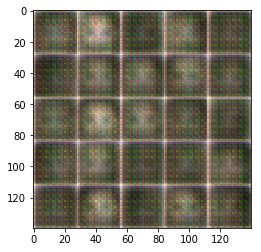

epoch 1/1... steps:120  discriminator_loss: 1.4875... generator_loss: 1.1627
epoch 1/1... steps:140  discriminator_loss: 1.4005... generator_loss: 1.2908
epoch 1/1... steps:160  discriminator_loss: 1.2336... generator_loss: 0.9514
epoch 1/1... steps:180  discriminator_loss: 1.2745... generator_loss: 0.9280
epoch 1/1... steps:200  discriminator_loss: 1.6501... generator_loss: 0.3847


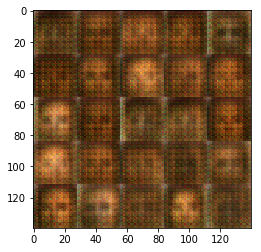

epoch 1/1... steps:220  discriminator_loss: 1.3742... generator_loss: 0.7291
epoch 1/1... steps:240  discriminator_loss: 1.6183... generator_loss: 1.2005
epoch 1/1... steps:260  discriminator_loss: 1.4920... generator_loss: 0.6321
epoch 1/1... steps:280  discriminator_loss: 1.4121... generator_loss: 1.0445
epoch 1/1... steps:300  discriminator_loss: 1.4822... generator_loss: 0.6520


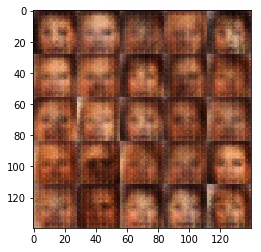

epoch 1/1... steps:320  discriminator_loss: 1.4351... generator_loss: 0.8231
epoch 1/1... steps:340  discriminator_loss: 1.2653... generator_loss: 1.0684
epoch 1/1... steps:360  discriminator_loss: 1.4079... generator_loss: 1.1174
epoch 1/1... steps:380  discriminator_loss: 1.2998... generator_loss: 0.8820
epoch 1/1... steps:400  discriminator_loss: 1.5696... generator_loss: 0.7641


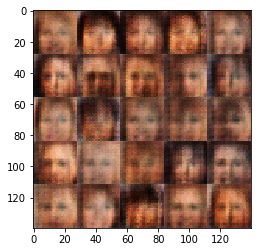

epoch 1/1... steps:420  discriminator_loss: 1.3058... generator_loss: 0.7872
epoch 1/1... steps:440  discriminator_loss: 1.3291... generator_loss: 0.7692
epoch 1/1... steps:460  discriminator_loss: 1.4334... generator_loss: 0.7851
epoch 1/1... steps:480  discriminator_loss: 1.3818... generator_loss: 0.9134
epoch 1/1... steps:500  discriminator_loss: 1.4638... generator_loss: 0.7424


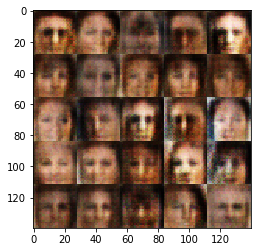

epoch 1/1... steps:520  discriminator_loss: 1.4664... generator_loss: 0.8753
epoch 1/1... steps:540  discriminator_loss: 1.4063... generator_loss: 0.9898
epoch 1/1... steps:560  discriminator_loss: 1.3511... generator_loss: 0.7588
epoch 1/1... steps:580  discriminator_loss: 1.3015... generator_loss: 0.6829
epoch 1/1... steps:600  discriminator_loss: 1.3971... generator_loss: 0.6524


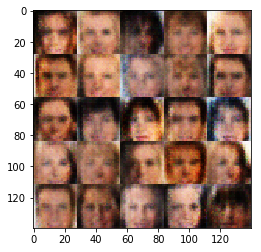

epoch 1/1... steps:620  discriminator_loss: 1.3815... generator_loss: 0.7686
epoch 1/1... steps:640  discriminator_loss: 1.3801... generator_loss: 0.8422
epoch 1/1... steps:660  discriminator_loss: 1.2926... generator_loss: 0.7339
epoch 1/1... steps:680  discriminator_loss: 1.3913... generator_loss: 0.9156
epoch 1/1... steps:700  discriminator_loss: 1.2769... generator_loss: 0.8895


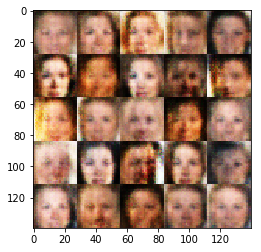

epoch 1/1... steps:720  discriminator_loss: 1.3022... generator_loss: 0.8457
epoch 1/1... steps:740  discriminator_loss: 1.3048... generator_loss: 1.1500
epoch 1/1... steps:760  discriminator_loss: 1.4817... generator_loss: 0.5486
epoch 1/1... steps:780  discriminator_loss: 1.3725... generator_loss: 0.8539
epoch 1/1... steps:800  discriminator_loss: 1.2583... generator_loss: 0.7273


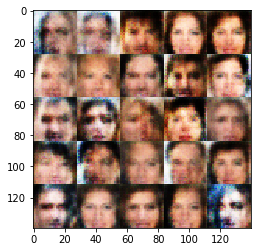

epoch 1/1... steps:820  discriminator_loss: 1.2931... generator_loss: 0.9969
epoch 1/1... steps:840  discriminator_loss: 1.2660... generator_loss: 0.9420
epoch 1/1... steps:860  discriminator_loss: 1.2907... generator_loss: 0.7917
epoch 1/1... steps:880  discriminator_loss: 1.2386... generator_loss: 0.8043
epoch 1/1... steps:900  discriminator_loss: 1.4810... generator_loss: 0.4636


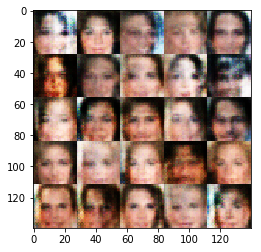

epoch 1/1... steps:920  discriminator_loss: 1.3184... generator_loss: 0.7414
epoch 1/1... steps:940  discriminator_loss: 1.3499... generator_loss: 0.6894
epoch 1/1... steps:960  discriminator_loss: 1.3524... generator_loss: 0.9102
epoch 1/1... steps:980  discriminator_loss: 1.2734... generator_loss: 0.7935
epoch 1/1... steps:1000  discriminator_loss: 1.3210... generator_loss: 1.6469


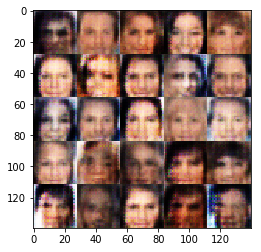

epoch 1/1... steps:1020  discriminator_loss: 1.3171... generator_loss: 0.7558
epoch 1/1... steps:1040  discriminator_loss: 1.4195... generator_loss: 0.9636
epoch 1/1... steps:1060  discriminator_loss: 1.4568... generator_loss: 0.4665
epoch 1/1... steps:1080  discriminator_loss: 1.4654... generator_loss: 1.0403
epoch 1/1... steps:1100  discriminator_loss: 1.3284... generator_loss: 0.7230


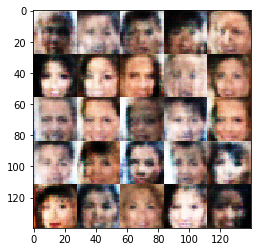

epoch 1/1... steps:1120  discriminator_loss: 1.3846... generator_loss: 1.0621
epoch 1/1... steps:1140  discriminator_loss: 1.3156... generator_loss: 0.7782
epoch 1/1... steps:1160  discriminator_loss: 1.3747... generator_loss: 0.6320
epoch 1/1... steps:1180  discriminator_loss: 1.3322... generator_loss: 0.9905
epoch 1/1... steps:1200  discriminator_loss: 1.3756... generator_loss: 0.6517


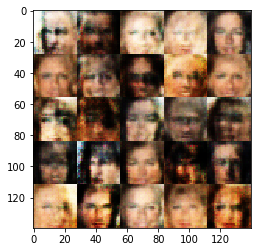

epoch 1/1... steps:1220  discriminator_loss: 1.6280... generator_loss: 0.3583
epoch 1/1... steps:1240  discriminator_loss: 1.2972... generator_loss: 1.0144
epoch 1/1... steps:1260  discriminator_loss: 1.3522... generator_loss: 0.6305
epoch 1/1... steps:1280  discriminator_loss: 1.5696... generator_loss: 0.5384
epoch 1/1... steps:1300  discriminator_loss: 1.1876... generator_loss: 0.9060


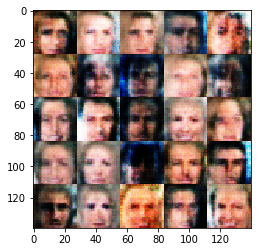

epoch 1/1... steps:1320  discriminator_loss: 1.3687... generator_loss: 0.9919
epoch 1/1... steps:1340  discriminator_loss: 1.4164... generator_loss: 0.5663
epoch 1/1... steps:1360  discriminator_loss: 1.6217... generator_loss: 1.7975
epoch 1/1... steps:1380  discriminator_loss: 1.2443... generator_loss: 1.1667
epoch 1/1... steps:1400  discriminator_loss: 1.1877... generator_loss: 0.7400


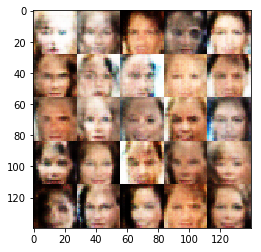

epoch 1/1... steps:1420  discriminator_loss: 1.2987... generator_loss: 1.2469
epoch 1/1... steps:1440  discriminator_loss: 1.0257... generator_loss: 1.0439
epoch 1/1... steps:1460  discriminator_loss: 1.3204... generator_loss: 0.8283
epoch 1/1... steps:1480  discriminator_loss: 1.3609... generator_loss: 0.7631
epoch 1/1... steps:1500  discriminator_loss: 1.2483... generator_loss: 1.0136


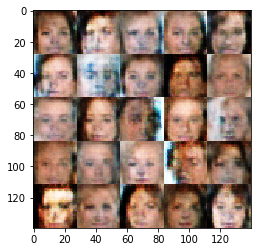

epoch 1/1... steps:1520  discriminator_loss: 1.1885... generator_loss: 1.0634
epoch 1/1... steps:1540  discriminator_loss: 1.0539... generator_loss: 1.1092
epoch 1/1... steps:1560  discriminator_loss: 1.0808... generator_loss: 0.8614
epoch 1/1... steps:1580  discriminator_loss: 1.1956... generator_loss: 0.9529
epoch 1/1... steps:1600  discriminator_loss: 1.1370... generator_loss: 0.8226


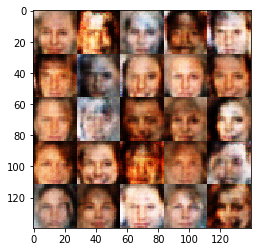

epoch 1/1... steps:1620  discriminator_loss: 1.2438... generator_loss: 0.8969
epoch 1/1... steps:1640  discriminator_loss: 1.2683... generator_loss: 0.7262
epoch 1/1... steps:1660  discriminator_loss: 1.3704... generator_loss: 0.7268
epoch 1/1... steps:1680  discriminator_loss: 1.2116... generator_loss: 0.7572
epoch 1/1... steps:1700  discriminator_loss: 1.4759... generator_loss: 0.5309


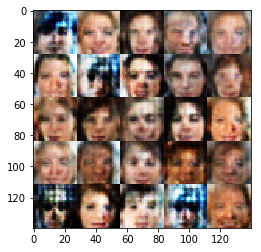

epoch 1/1... steps:1720  discriminator_loss: 1.2376... generator_loss: 0.9319
epoch 1/1... steps:1740  discriminator_loss: 1.1203... generator_loss: 1.1942
epoch 1/1... steps:1760  discriminator_loss: 1.2869... generator_loss: 0.7360
epoch 1/1... steps:1780  discriminator_loss: 1.2063... generator_loss: 1.1770
epoch 1/1... steps:1800  discriminator_loss: 1.2990... generator_loss: 1.2451


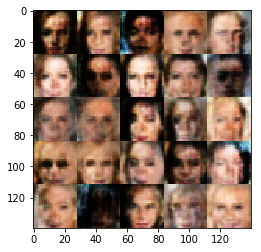

epoch 1/1... steps:1820  discriminator_loss: 1.2326... generator_loss: 0.9017
epoch 1/1... steps:1840  discriminator_loss: 1.3380... generator_loss: 0.9003
epoch 1/1... steps:1860  discriminator_loss: 1.2793... generator_loss: 0.8679
epoch 1/1... steps:1880  discriminator_loss: 1.3127... generator_loss: 0.9408
epoch 1/1... steps:1900  discriminator_loss: 1.4745... generator_loss: 0.5106


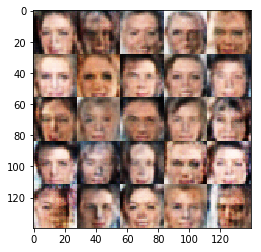

epoch 1/1... steps:1920  discriminator_loss: 1.1448... generator_loss: 1.3257
epoch 1/1... steps:1940  discriminator_loss: 1.2825... generator_loss: 0.7496
epoch 1/1... steps:1960  discriminator_loss: 1.4430... generator_loss: 0.8274
epoch 1/1... steps:1980  discriminator_loss: 1.2411... generator_loss: 0.7601
epoch 1/1... steps:2000  discriminator_loss: 1.3680... generator_loss: 0.6991


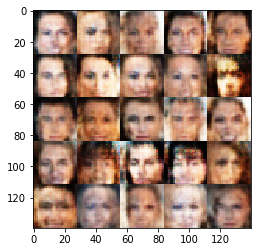

epoch 1/1... steps:2020  discriminator_loss: 1.1981... generator_loss: 0.7970
epoch 1/1... steps:2040  discriminator_loss: 1.1447... generator_loss: 1.0165
epoch 1/1... steps:2060  discriminator_loss: 1.2637... generator_loss: 0.8386
epoch 1/1... steps:2080  discriminator_loss: 1.2412... generator_loss: 0.8908
epoch 1/1... steps:2100  discriminator_loss: 1.5872... generator_loss: 0.3800


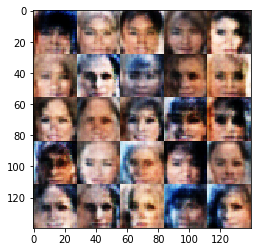

epoch 1/1... steps:2120  discriminator_loss: 1.2006... generator_loss: 0.8838
epoch 1/1... steps:2140  discriminator_loss: 1.3672... generator_loss: 0.6330
epoch 1/1... steps:2160  discriminator_loss: 1.2604... generator_loss: 0.9938
epoch 1/1... steps:2180  discriminator_loss: 1.1566... generator_loss: 0.9185
epoch 1/1... steps:2200  discriminator_loss: 1.1823... generator_loss: 0.9413


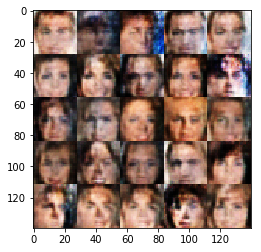

epoch 1/1... steps:2220  discriminator_loss: 1.5473... generator_loss: 0.8475
epoch 1/1... steps:2240  discriminator_loss: 1.1345... generator_loss: 0.9151
epoch 1/1... steps:2260  discriminator_loss: 1.1450... generator_loss: 0.7412
epoch 1/1... steps:2280  discriminator_loss: 1.5953... generator_loss: 0.3881
epoch 1/1... steps:2300  discriminator_loss: 1.0574... generator_loss: 0.9703


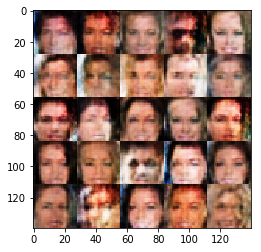

epoch 1/1... steps:2320  discriminator_loss: 1.2997... generator_loss: 0.9099
epoch 1/1... steps:2340  discriminator_loss: 1.2867... generator_loss: 1.2069
epoch 1/1... steps:2360  discriminator_loss: 1.2770... generator_loss: 0.7648
epoch 1/1... steps:2380  discriminator_loss: 1.2611... generator_loss: 0.8638
epoch 1/1... steps:2400  discriminator_loss: 1.3141... generator_loss: 0.7795


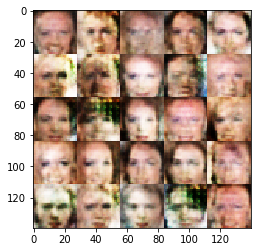

epoch 1/1... steps:2420  discriminator_loss: 1.3568... generator_loss: 0.5832
epoch 1/1... steps:2440  discriminator_loss: 1.2717... generator_loss: 0.7314
epoch 1/1... steps:2460  discriminator_loss: 1.2663... generator_loss: 0.7887
epoch 1/1... steps:2480  discriminator_loss: 1.2731... generator_loss: 0.9544
epoch 1/1... steps:2500  discriminator_loss: 1.2116... generator_loss: 1.1419


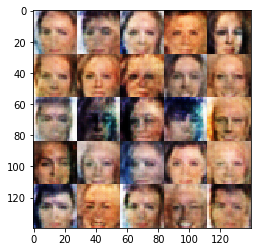

epoch 1/1... steps:2520  discriminator_loss: 1.2664... generator_loss: 0.8152
epoch 1/1... steps:2540  discriminator_loss: 1.1475... generator_loss: 0.9947
epoch 1/1... steps:2560  discriminator_loss: 1.1572... generator_loss: 0.8807
epoch 1/1... steps:2580  discriminator_loss: 1.1495... generator_loss: 0.8891
epoch 1/1... steps:2600  discriminator_loss: 1.1098... generator_loss: 1.0537


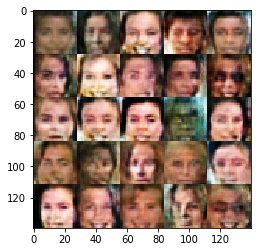

epoch 1/1... steps:2620  discriminator_loss: 1.0341... generator_loss: 1.3084
epoch 1/1... steps:2640  discriminator_loss: 1.2318... generator_loss: 0.7068
epoch 1/1... steps:2660  discriminator_loss: 1.1275... generator_loss: 0.8994
epoch 1/1... steps:2680  discriminator_loss: 1.3943... generator_loss: 0.7948
epoch 1/1... steps:2700  discriminator_loss: 1.0708... generator_loss: 1.1446


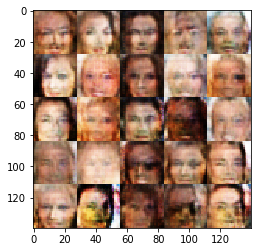

epoch 1/1... steps:2720  discriminator_loss: 1.3482... generator_loss: 0.5656
epoch 1/1... steps:2740  discriminator_loss: 1.2474... generator_loss: 0.9518
epoch 1/1... steps:2760  discriminator_loss: 1.4229... generator_loss: 0.6131
epoch 1/1... steps:2780  discriminator_loss: 1.1982... generator_loss: 1.4860
epoch 1/1... steps:2800  discriminator_loss: 1.2730... generator_loss: 1.1985


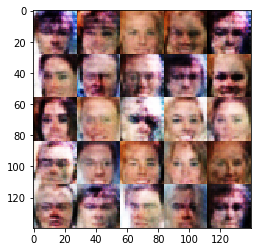

epoch 1/1... steps:2820  discriminator_loss: 1.2941... generator_loss: 0.7954
epoch 1/1... steps:2840  discriminator_loss: 1.2570... generator_loss: 0.7810
epoch 1/1... steps:2860  discriminator_loss: 1.4606... generator_loss: 0.4905
epoch 1/1... steps:2880  discriminator_loss: 1.0688... generator_loss: 0.9874
epoch 1/1... steps:2900  discriminator_loss: 1.3195... generator_loss: 0.6429


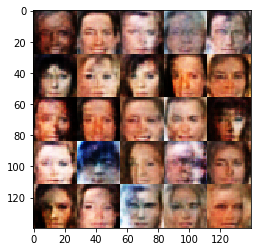

epoch 1/1... steps:2920  discriminator_loss: 1.2988... generator_loss: 0.7865
epoch 1/1... steps:2940  discriminator_loss: 1.1885... generator_loss: 0.6823
epoch 1/1... steps:2960  discriminator_loss: 1.3559... generator_loss: 0.5991
epoch 1/1... steps:2980  discriminator_loss: 1.1758... generator_loss: 0.8259
epoch 1/1... steps:3000  discriminator_loss: 1.2503... generator_loss: 0.6271


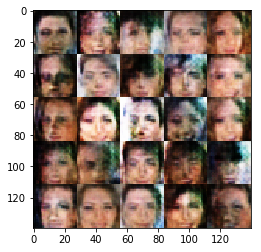

epoch 1/1... steps:3020  discriminator_loss: 1.2220... generator_loss: 0.7684
epoch 1/1... steps:3040  discriminator_loss: 1.4186... generator_loss: 1.2251
epoch 1/1... steps:3060  discriminator_loss: 1.3387... generator_loss: 0.9335
epoch 1/1... steps:3080  discriminator_loss: 1.2886... generator_loss: 0.6578
epoch 1/1... steps:3100  discriminator_loss: 1.1995... generator_loss: 0.7625


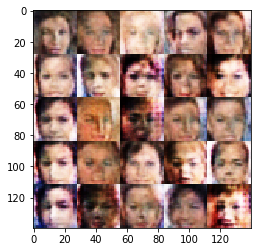

epoch 1/1... steps:3120  discriminator_loss: 1.2114... generator_loss: 1.0790
epoch 1/1... steps:3140  discriminator_loss: 1.3147... generator_loss: 0.6524
epoch 1/1... steps:3160  discriminator_loss: 1.0021... generator_loss: 1.4507
epoch 1/1... steps:3180  discriminator_loss: 1.3086... generator_loss: 1.2218
epoch 1/1... steps:3200  discriminator_loss: 1.2182... generator_loss: 1.1524


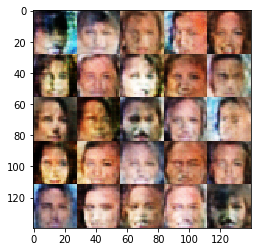

epoch 1/1... steps:3220  discriminator_loss: 1.2413... generator_loss: 1.0972
epoch 1/1... steps:3240  discriminator_loss: 1.2780... generator_loss: 0.8061
epoch 1/1... steps:3260  discriminator_loss: 0.9755... generator_loss: 1.0528
epoch 1/1... steps:3280  discriminator_loss: 1.1599... generator_loss: 0.7772
epoch 1/1... steps:3300  discriminator_loss: 1.1336... generator_loss: 0.8529


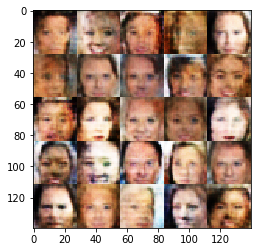

epoch 1/1... steps:3320  discriminator_loss: 1.1772... generator_loss: 0.9175
epoch 1/1... steps:3340  discriminator_loss: 1.2221... generator_loss: 0.6576
epoch 1/1... steps:3360  discriminator_loss: 1.2459... generator_loss: 0.8056
epoch 1/1... steps:3380  discriminator_loss: 1.2390... generator_loss: 0.7620
epoch 1/1... steps:3400  discriminator_loss: 1.3147... generator_loss: 0.6787


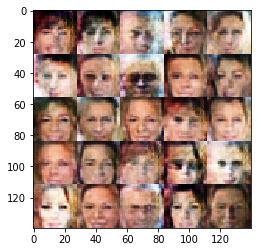

epoch 1/1... steps:3420  discriminator_loss: 1.0850... generator_loss: 1.9718
epoch 1/1... steps:3440  discriminator_loss: 1.0727... generator_loss: 0.9513
epoch 1/1... steps:3460  discriminator_loss: 1.3441... generator_loss: 0.7179
epoch 1/1... steps:3480  discriminator_loss: 1.3184... generator_loss: 0.6163
epoch 1/1... steps:3500  discriminator_loss: 1.2722... generator_loss: 0.6218


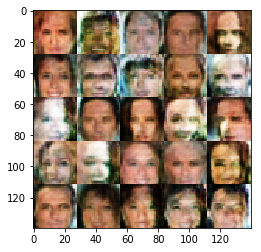

epoch 1/1... steps:3520  discriminator_loss: 1.3581... generator_loss: 0.7938
epoch 1/1... steps:3540  discriminator_loss: 1.3617... generator_loss: 0.7063
epoch 1/1... steps:3560  discriminator_loss: 1.2065... generator_loss: 1.1888
epoch 1/1... steps:3580  discriminator_loss: 1.0356... generator_loss: 1.2946
epoch 1/1... steps:3600  discriminator_loss: 1.4600... generator_loss: 0.4392


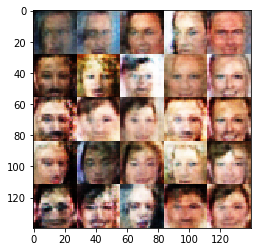

epoch 1/1... steps:3620  discriminator_loss: 1.1123... generator_loss: 0.8754
epoch 1/1... steps:3640  discriminator_loss: 1.2235... generator_loss: 0.7694
epoch 1/1... steps:3660  discriminator_loss: 1.0694... generator_loss: 1.0347
epoch 1/1... steps:3680  discriminator_loss: 1.1186... generator_loss: 1.2935
epoch 1/1... steps:3700  discriminator_loss: 1.2177... generator_loss: 0.7482


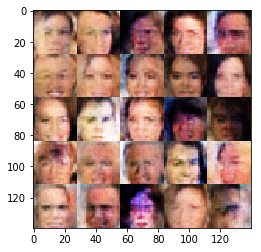

epoch 1/1... steps:3720  discriminator_loss: 1.2028... generator_loss: 0.7514
epoch 1/1... steps:3740  discriminator_loss: 1.0156... generator_loss: 1.1512
epoch 1/1... steps:3760  discriminator_loss: 1.0521... generator_loss: 0.9232
epoch 1/1... steps:3780  discriminator_loss: 1.1604... generator_loss: 0.7634
epoch 1/1... steps:3800  discriminator_loss: 1.2072... generator_loss: 0.8481


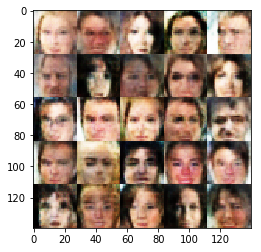

epoch 1/1... steps:3820  discriminator_loss: 1.1160... generator_loss: 0.9805
epoch 1/1... steps:3840  discriminator_loss: 1.2043... generator_loss: 0.7381
epoch 1/1... steps:3860  discriminator_loss: 1.1382... generator_loss: 0.7434
epoch 1/1... steps:3880  discriminator_loss: 1.2881... generator_loss: 1.0820
epoch 1/1... steps:3900  discriminator_loss: 1.1391... generator_loss: 0.9624


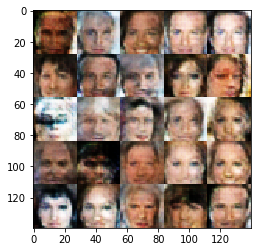

epoch 1/1... steps:3920  discriminator_loss: 1.4889... generator_loss: 0.4538
epoch 1/1... steps:3940  discriminator_loss: 1.2364... generator_loss: 0.8048
epoch 1/1... steps:3960  discriminator_loss: 1.1372... generator_loss: 0.7770
epoch 1/1... steps:3980  discriminator_loss: 1.1505... generator_loss: 0.8144
epoch 1/1... steps:4000  discriminator_loss: 1.5797... generator_loss: 0.3668


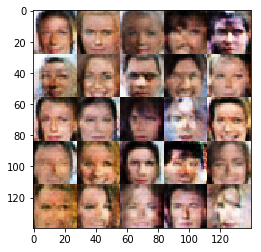

epoch 1/1... steps:4020  discriminator_loss: 0.9012... generator_loss: 1.1802
epoch 1/1... steps:4040  discriminator_loss: 1.2925... generator_loss: 0.8717
epoch 1/1... steps:4060  discriminator_loss: 1.2558... generator_loss: 0.9365
epoch 1/1... steps:4080  discriminator_loss: 1.1944... generator_loss: 1.0281
epoch 1/1... steps:4100  discriminator_loss: 1.1311... generator_loss: 1.0344


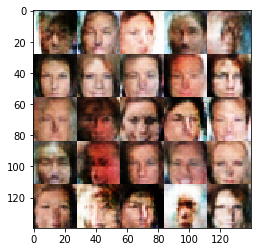

epoch 1/1... steps:4120  discriminator_loss: 1.1529... generator_loss: 0.7513
epoch 1/1... steps:4140  discriminator_loss: 1.3355... generator_loss: 0.6326
epoch 1/1... steps:4160  discriminator_loss: 1.0349... generator_loss: 1.7682
epoch 1/1... steps:4180  discriminator_loss: 0.8589... generator_loss: 1.0427
epoch 1/1... steps:4200  discriminator_loss: 1.4345... generator_loss: 0.5150


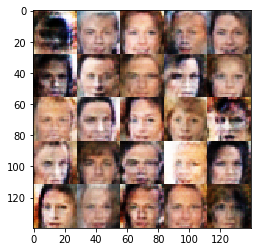

epoch 1/1... steps:4220  discriminator_loss: 1.2871... generator_loss: 0.8406
epoch 1/1... steps:4240  discriminator_loss: 1.1401... generator_loss: 1.3928
epoch 1/1... steps:4260  discriminator_loss: 1.2738... generator_loss: 0.6377
epoch 1/1... steps:4280  discriminator_loss: 1.4859... generator_loss: 0.4196
epoch 1/1... steps:4300  discriminator_loss: 1.2509... generator_loss: 0.6160


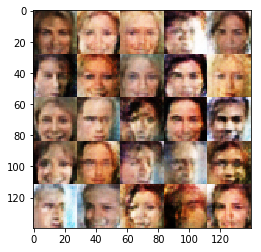

epoch 1/1... steps:4320  discriminator_loss: 1.0717... generator_loss: 0.9040
epoch 1/1... steps:4340  discriminator_loss: 1.0989... generator_loss: 1.5175
epoch 1/1... steps:4360  discriminator_loss: 1.2259... generator_loss: 1.5620
epoch 1/1... steps:4380  discriminator_loss: 0.7859... generator_loss: 1.3803
epoch 1/1... steps:4400  discriminator_loss: 1.1701... generator_loss: 1.1884


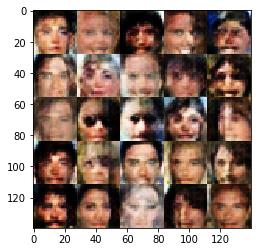

epoch 1/1... steps:4420  discriminator_loss: 1.1838... generator_loss: 0.6026
epoch 1/1... steps:4440  discriminator_loss: 1.2145... generator_loss: 1.1375
epoch 1/1... steps:4460  discriminator_loss: 0.9216... generator_loss: 1.2153
epoch 1/1... steps:4480  discriminator_loss: 1.8662... generator_loss: 0.2597
epoch 1/1... steps:4500  discriminator_loss: 1.2099... generator_loss: 0.7737


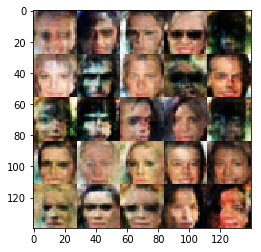

epoch 1/1... steps:4520  discriminator_loss: 1.1896... generator_loss: 1.0547
epoch 1/1... steps:4540  discriminator_loss: 1.2345... generator_loss: 1.0607
epoch 1/1... steps:4560  discriminator_loss: 1.0611... generator_loss: 1.2089
epoch 1/1... steps:4580  discriminator_loss: 1.0393... generator_loss: 1.0875
epoch 1/1... steps:4600  discriminator_loss: 1.2044... generator_loss: 0.7679


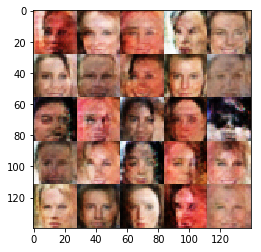

epoch 1/1... steps:4620  discriminator_loss: 1.2876... generator_loss: 0.5503
epoch 1/1... steps:4640  discriminator_loss: 1.0527... generator_loss: 1.3863
epoch 1/1... steps:4660  discriminator_loss: 1.2661... generator_loss: 0.6201
epoch 1/1... steps:4680  discriminator_loss: 1.2515... generator_loss: 0.7938
epoch 1/1... steps:4700  discriminator_loss: 1.1372... generator_loss: 0.9835


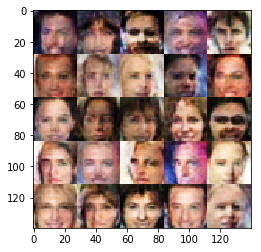

epoch 1/1... steps:4720  discriminator_loss: 1.2693... generator_loss: 1.4894
epoch 1/1... steps:4740  discriminator_loss: 1.2526... generator_loss: 1.1856
epoch 1/1... steps:4760  discriminator_loss: 1.1470... generator_loss: 0.6945
epoch 1/1... steps:4780  discriminator_loss: 1.0282... generator_loss: 1.4393
epoch 1/1... steps:4800  discriminator_loss: 1.2996... generator_loss: 0.6136


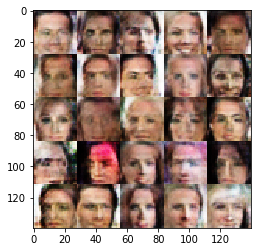

epoch 1/1... steps:4820  discriminator_loss: 1.0770... generator_loss: 0.8213
epoch 1/1... steps:4840  discriminator_loss: 1.1625... generator_loss: 1.4172
epoch 1/1... steps:4860  discriminator_loss: 1.2231... generator_loss: 0.7337
epoch 1/1... steps:4880  discriminator_loss: 1.1269... generator_loss: 1.0794
epoch 1/1... steps:4900  discriminator_loss: 1.4654... generator_loss: 0.5052


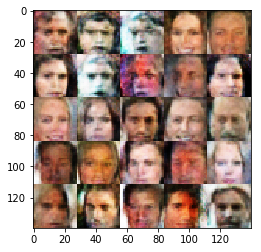

epoch 1/1... steps:4920  discriminator_loss: 1.1571... generator_loss: 0.7103
epoch 1/1... steps:4940  discriminator_loss: 1.0494... generator_loss: 1.5829
epoch 1/1... steps:4960  discriminator_loss: 1.1135... generator_loss: 1.1832
epoch 1/1... steps:4980  discriminator_loss: 1.1006... generator_loss: 0.8378
epoch 1/1... steps:5000  discriminator_loss: 1.1442... generator_loss: 0.7714


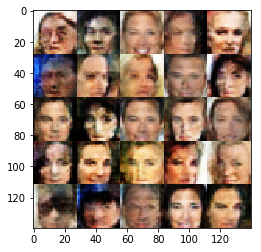

epoch 1/1... steps:5020  discriminator_loss: 1.1002... generator_loss: 1.0262
epoch 1/1... steps:5040  discriminator_loss: 1.1916... generator_loss: 0.8288
epoch 1/1... steps:5060  discriminator_loss: 0.8472... generator_loss: 1.2334
epoch 1/1... steps:5080  discriminator_loss: 1.0653... generator_loss: 2.0069
epoch 1/1... steps:5100  discriminator_loss: 1.1714... generator_loss: 0.9512


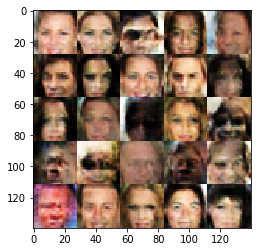

epoch 1/1... steps:5120  discriminator_loss: 1.1847... generator_loss: 1.4050
epoch 1/1... steps:5140  discriminator_loss: 1.2587... generator_loss: 0.8280
epoch 1/1... steps:5160  discriminator_loss: 1.6069... generator_loss: 0.3626
epoch 1/1... steps:5180  discriminator_loss: 1.1495... generator_loss: 0.8471
epoch 1/1... steps:5200  discriminator_loss: 1.3528... generator_loss: 0.5446


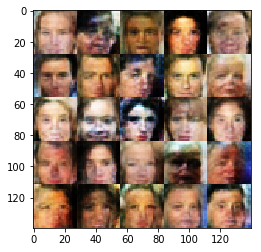

epoch 1/1... steps:5220  discriminator_loss: 1.1638... generator_loss: 0.9305
epoch 1/1... steps:5240  discriminator_loss: 1.1267... generator_loss: 0.9126
epoch 1/1... steps:5260  discriminator_loss: 0.8040... generator_loss: 1.2535
epoch 1/1... steps:5280  discriminator_loss: 1.0260... generator_loss: 1.2973
epoch 1/1... steps:5300  discriminator_loss: 1.3455... generator_loss: 0.6034


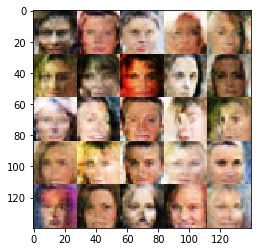

epoch 1/1... steps:5320  discriminator_loss: 1.2974... generator_loss: 0.9921
epoch 1/1... steps:5340  discriminator_loss: 1.2999... generator_loss: 0.5781
epoch 1/1... steps:5360  discriminator_loss: 1.1775... generator_loss: 0.9058
epoch 1/1... steps:5380  discriminator_loss: 1.1393... generator_loss: 0.8561
epoch 1/1... steps:5400  discriminator_loss: 1.0551... generator_loss: 1.0758


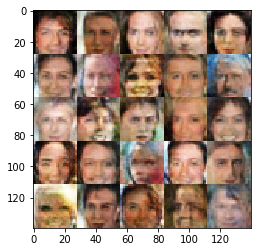

epoch 1/1... steps:5420  discriminator_loss: 1.1390... generator_loss: 1.0286
epoch 1/1... steps:5440  discriminator_loss: 0.8778... generator_loss: 0.9961
epoch 1/1... steps:5460  discriminator_loss: 1.1607... generator_loss: 0.6529
epoch 1/1... steps:5480  discriminator_loss: 1.3669... generator_loss: 0.5445
epoch 1/1... steps:5500  discriminator_loss: 1.3108... generator_loss: 0.5312


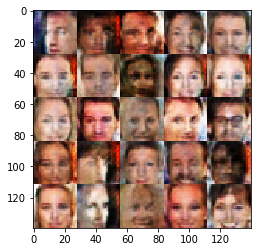

epoch 1/1... steps:5520  discriminator_loss: 0.8488... generator_loss: 1.5241
epoch 1/1... steps:5540  discriminator_loss: 0.8432... generator_loss: 1.6282
epoch 1/1... steps:5560  discriminator_loss: 0.8910... generator_loss: 1.1959
epoch 1/1... steps:5580  discriminator_loss: 1.1730... generator_loss: 0.7835
epoch 1/1... steps:5600  discriminator_loss: 1.1827... generator_loss: 1.1848


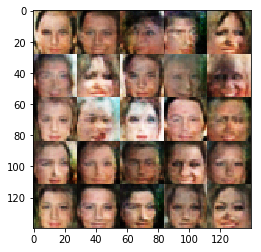

epoch 1/1... steps:5620  discriminator_loss: 1.1920... generator_loss: 0.9154
epoch 1/1... steps:5640  discriminator_loss: 0.9561... generator_loss: 1.0342
epoch 1/1... steps:5660  discriminator_loss: 0.7762... generator_loss: 1.1381
epoch 1/1... steps:5680  discriminator_loss: 0.9183... generator_loss: 1.0892
epoch 1/1... steps:5700  discriminator_loss: 1.0059... generator_loss: 0.9848


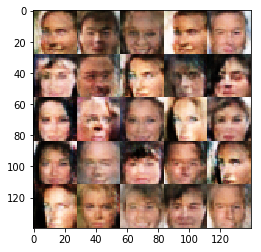

epoch 1/1... steps:5720  discriminator_loss: 0.9986... generator_loss: 1.0616
epoch 1/1... steps:5740  discriminator_loss: 1.2615... generator_loss: 0.5657
epoch 1/1... steps:5760  discriminator_loss: 1.0491... generator_loss: 1.1448
epoch 1/1... steps:5780  discriminator_loss: 1.1900... generator_loss: 0.6141
epoch 1/1... steps:5800  discriminator_loss: 1.2909... generator_loss: 1.4563


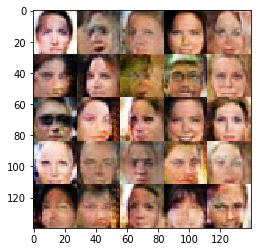

epoch 1/1... steps:5820  discriminator_loss: 1.0645... generator_loss: 1.8173
epoch 1/1... steps:5840  discriminator_loss: 1.6186... generator_loss: 0.4443
epoch 1/1... steps:5860  discriminator_loss: 1.4196... generator_loss: 0.5110
epoch 1/1... steps:5880  discriminator_loss: 1.4313... generator_loss: 0.4649
epoch 1/1... steps:5900  discriminator_loss: 0.7819... generator_loss: 1.2952


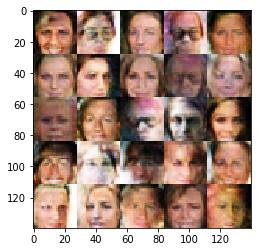

epoch 1/1... steps:5920  discriminator_loss: 1.3608... generator_loss: 0.4876
epoch 1/1... steps:5940  discriminator_loss: 0.7416... generator_loss: 1.5821
epoch 1/1... steps:5960  discriminator_loss: 1.1437... generator_loss: 1.4017
epoch 1/1... steps:5980  discriminator_loss: 1.0938... generator_loss: 0.8731
epoch 1/1... steps:6000  discriminator_loss: 1.2029... generator_loss: 0.7279


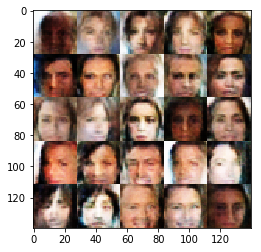

epoch 1/1... steps:6020  discriminator_loss: 1.2212... generator_loss: 0.5853
epoch 1/1... steps:6040  discriminator_loss: 0.9820... generator_loss: 1.1136
epoch 1/1... steps:6060  discriminator_loss: 0.6987... generator_loss: 1.6069
epoch 1/1... steps:6080  discriminator_loss: 1.2876... generator_loss: 1.1116
epoch 1/1... steps:6100  discriminator_loss: 1.0853... generator_loss: 0.9472


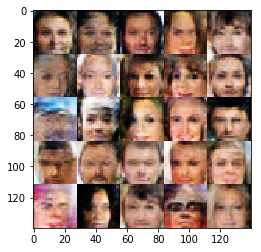

epoch 1/1... steps:6120  discriminator_loss: 0.9347... generator_loss: 0.9171
epoch 1/1... steps:6140  discriminator_loss: 1.1306... generator_loss: 1.5958
epoch 1/1... steps:6160  discriminator_loss: 1.1212... generator_loss: 0.6822
epoch 1/1... steps:6180  discriminator_loss: 1.0904... generator_loss: 1.2495
epoch 1/1... steps:6200  discriminator_loss: 1.0400... generator_loss: 1.6859


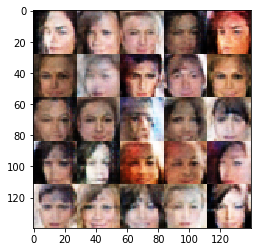

epoch 1/1... steps:6220  discriminator_loss: 1.0394... generator_loss: 1.4223
epoch 1/1... steps:6240  discriminator_loss: 1.2470... generator_loss: 0.5587
epoch 1/1... steps:6260  discriminator_loss: 1.3089... generator_loss: 0.5905
epoch 1/1... steps:6280  discriminator_loss: 1.1935... generator_loss: 0.5966
epoch 1/1... steps:6300  discriminator_loss: 1.1609... generator_loss: 0.6496


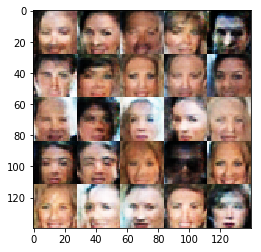

epoch 1/1... steps:6320  discriminator_loss: 0.9598... generator_loss: 0.8954
epoch 1/1... steps:6340  discriminator_loss: 1.2360... generator_loss: 0.5919
epoch 1/1... steps:6360  discriminator_loss: 1.0550... generator_loss: 0.9166
epoch 1/1... steps:6380  discriminator_loss: 0.9330... generator_loss: 3.4321
epoch 1/1... steps:6400  discriminator_loss: 0.9786... generator_loss: 2.0351


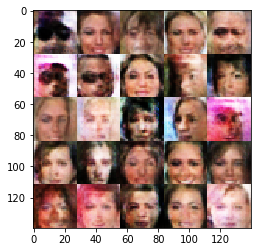

epoch 1/1... steps:6420  discriminator_loss: 1.0917... generator_loss: 0.9303
epoch 1/1... steps:6440  discriminator_loss: 1.3160... generator_loss: 0.5194
epoch 1/1... steps:6460  discriminator_loss: 0.7679... generator_loss: 1.6207
epoch 1/1... steps:6480  discriminator_loss: 1.0777... generator_loss: 0.7363
epoch 1/1... steps:6500  discriminator_loss: 0.5175... generator_loss: 1.9936


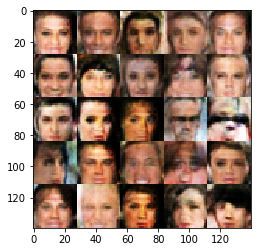

epoch 1/1... steps:6520  discriminator_loss: 1.1845... generator_loss: 0.6646
epoch 1/1... steps:6540  discriminator_loss: 0.9422... generator_loss: 1.1310
epoch 1/1... steps:6560  discriminator_loss: 0.9916... generator_loss: 1.6879
epoch 1/1... steps:6580  discriminator_loss: 1.2802... generator_loss: 0.7880
epoch 1/1... steps:6600  discriminator_loss: 1.1156... generator_loss: 1.2055


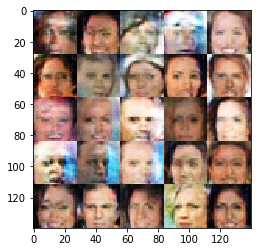

epoch 1/1... steps:6620  discriminator_loss: 1.1971... generator_loss: 0.6953
epoch 1/1... steps:6640  discriminator_loss: 0.9902... generator_loss: 1.1050
epoch 1/1... steps:6660  discriminator_loss: 1.2228... generator_loss: 0.7083
epoch 1/1... steps:6680  discriminator_loss: 0.9777... generator_loss: 1.3954
epoch 1/1... steps:6700  discriminator_loss: 1.0816... generator_loss: 0.9940


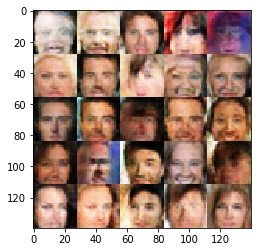

epoch 1/1... steps:6720  discriminator_loss: 1.1114... generator_loss: 0.8434
epoch 1/1... steps:6740  discriminator_loss: 1.0076... generator_loss: 0.8874
epoch 1/1... steps:6760  discriminator_loss: 1.0010... generator_loss: 0.8364
epoch 1/1... steps:6780  discriminator_loss: 1.0732... generator_loss: 0.8495
epoch 1/1... steps:6800  discriminator_loss: 1.0336... generator_loss: 0.8189


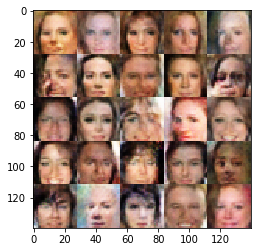

epoch 1/1... steps:6820  discriminator_loss: 1.0821... generator_loss: 1.3199
epoch 1/1... steps:6840  discriminator_loss: 1.2202... generator_loss: 0.6192
epoch 1/1... steps:6860  discriminator_loss: 1.0033... generator_loss: 1.1936
epoch 1/1... steps:6880  discriminator_loss: 1.2262... generator_loss: 0.6760
epoch 1/1... steps:6900  discriminator_loss: 1.2599... generator_loss: 0.5743


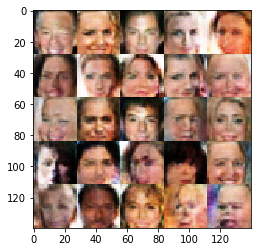

epoch 1/1... steps:6920  discriminator_loss: 1.1649... generator_loss: 0.7843
epoch 1/1... steps:6940  discriminator_loss: 1.1664... generator_loss: 1.8047
epoch 1/1... steps:6960  discriminator_loss: 1.1785... generator_loss: 0.7883
epoch 1/1... steps:6980  discriminator_loss: 1.1960... generator_loss: 0.6727
epoch 1/1... steps:7000  discriminator_loss: 1.1433... generator_loss: 0.8960


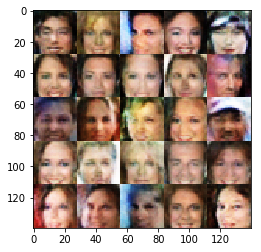

epoch 1/1... steps:7020  discriminator_loss: 1.1216... generator_loss: 0.8029
epoch 1/1... steps:7040  discriminator_loss: 1.2744... generator_loss: 1.2839
epoch 1/1... steps:7060  discriminator_loss: 1.0582... generator_loss: 0.9578
epoch 1/1... steps:7080  discriminator_loss: 1.2472... generator_loss: 0.6572
epoch 1/1... steps:7100  discriminator_loss: 1.0800... generator_loss: 0.8949


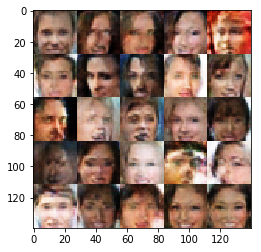

epoch 1/1... steps:7120  discriminator_loss: 1.3063... generator_loss: 0.6413
epoch 1/1... steps:7140  discriminator_loss: 1.0022... generator_loss: 0.9405
epoch 1/1... steps:7160  discriminator_loss: 1.1124... generator_loss: 0.9614
epoch 1/1... steps:7180  discriminator_loss: 1.1621... generator_loss: 0.8298
epoch 1/1... steps:7200  discriminator_loss: 1.1774... generator_loss: 0.6562


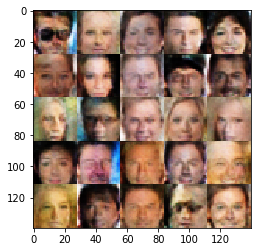

epoch 1/1... steps:7220  discriminator_loss: 1.1490... generator_loss: 0.9927
epoch 1/1... steps:7240  discriminator_loss: 1.2141... generator_loss: 1.0242
epoch 1/1... steps:7260  discriminator_loss: 1.1877... generator_loss: 1.1941
epoch 1/1... steps:7280  discriminator_loss: 1.0645... generator_loss: 0.8422
epoch 1/1... steps:7300  discriminator_loss: 1.2654... generator_loss: 0.5709


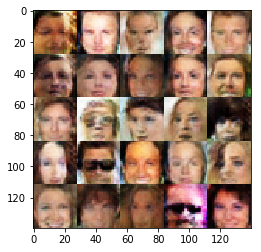

epoch 1/1... steps:7320  discriminator_loss: 1.2225... generator_loss: 0.6693
epoch 1/1... steps:7340  discriminator_loss: 1.0831... generator_loss: 0.9392
epoch 1/1... steps:7360  discriminator_loss: 1.1745... generator_loss: 0.8667
epoch 1/1... steps:7380  discriminator_loss: 1.2904... generator_loss: 0.5434
epoch 1/1... steps:7400  discriminator_loss: 0.9494... generator_loss: 1.2421


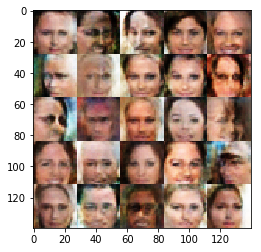

epoch 1/1... steps:7420  discriminator_loss: 1.3293... generator_loss: 0.5296
epoch 1/1... steps:7440  discriminator_loss: 1.1553... generator_loss: 0.8539
epoch 1/1... steps:7460  discriminator_loss: 1.2978... generator_loss: 1.3963
epoch 1/1... steps:7480  discriminator_loss: 1.1290... generator_loss: 1.0414
epoch 1/1... steps:7500  discriminator_loss: 1.2748... generator_loss: 0.6195


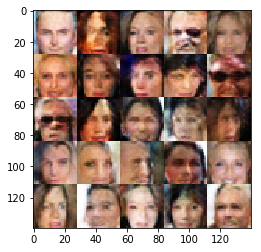

epoch 1/1... steps:7520  discriminator_loss: 1.2441... generator_loss: 0.7087
epoch 1/1... steps:7540  discriminator_loss: 0.9787... generator_loss: 1.2884
epoch 1/1... steps:7560  discriminator_loss: 1.0134... generator_loss: 0.8573
epoch 1/1... steps:7580  discriminator_loss: 1.0955... generator_loss: 1.0762
epoch 1/1... steps:7600  discriminator_loss: 1.2715... generator_loss: 0.5675


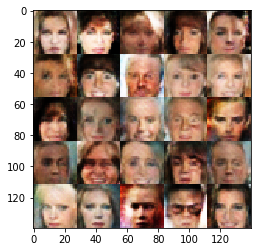

epoch 1/1... steps:7620  discriminator_loss: 1.1719... generator_loss: 0.8524
epoch 1/1... steps:7640  discriminator_loss: 1.0276... generator_loss: 0.8437
epoch 1/1... steps:7660  discriminator_loss: 1.0048... generator_loss: 1.0351
epoch 1/1... steps:7680  discriminator_loss: 1.2145... generator_loss: 0.6278
epoch 1/1... steps:7700  discriminator_loss: 1.4397... generator_loss: 0.4768


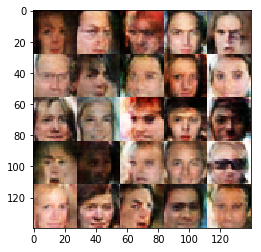

epoch 1/1... steps:7720  discriminator_loss: 1.1728... generator_loss: 0.9221
epoch 1/1... steps:7740  discriminator_loss: 1.1678... generator_loss: 1.1747
epoch 1/1... steps:7760  discriminator_loss: 1.1549... generator_loss: 0.6775
epoch 1/1... steps:7780  discriminator_loss: 1.3260... generator_loss: 1.2985
epoch 1/1... steps:7800  discriminator_loss: 0.8364... generator_loss: 2.2373


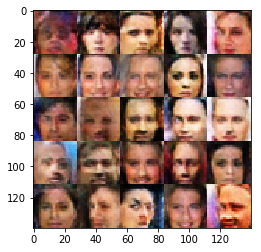

epoch 1/1... steps:7820  discriminator_loss: 1.2093... generator_loss: 0.7640
epoch 1/1... steps:7840  discriminator_loss: 1.0687... generator_loss: 0.8753
epoch 1/1... steps:7860  discriminator_loss: 1.5229... generator_loss: 0.4241
epoch 1/1... steps:7880  discriminator_loss: 0.8555... generator_loss: 1.0154
epoch 1/1... steps:7900  discriminator_loss: 1.1061... generator_loss: 2.2970


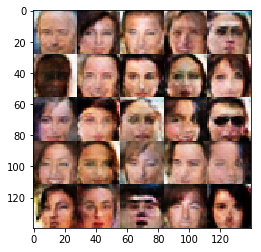

epoch 1/1... steps:7920  discriminator_loss: 0.9400... generator_loss: 1.4142
epoch 1/1... steps:7940  discriminator_loss: 1.3510... generator_loss: 0.5511
epoch 1/1... steps:7960  discriminator_loss: 1.1626... generator_loss: 1.0699
epoch 1/1... steps:7980  discriminator_loss: 0.5780... generator_loss: 2.4171
epoch 1/1... steps:8000  discriminator_loss: 0.6617... generator_loss: 1.8992


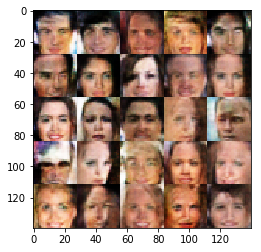

epoch 1/1... steps:8020  discriminator_loss: 1.0041... generator_loss: 0.7709
epoch 1/1... steps:8040  discriminator_loss: 1.1770... generator_loss: 0.6130
epoch 1/1... steps:8060  discriminator_loss: 1.9113... generator_loss: 0.2570
epoch 1/1... steps:8080  discriminator_loss: 1.2651... generator_loss: 0.5893
epoch 1/1... steps:8100  discriminator_loss: 1.3115... generator_loss: 0.6826


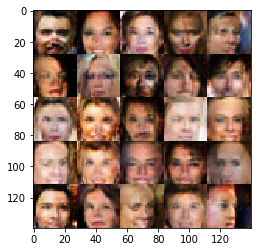

epoch 1/1... steps:8120  discriminator_loss: 0.9516... generator_loss: 1.2805
epoch 1/1... steps:8140  discriminator_loss: 1.0508... generator_loss: 1.0510
epoch 1/1... steps:8160  discriminator_loss: 0.9807... generator_loss: 2.1896
epoch 1/1... steps:8180  discriminator_loss: 1.4660... generator_loss: 3.0751
epoch 1/1... steps:8200  discriminator_loss: 0.5616... generator_loss: 1.7027


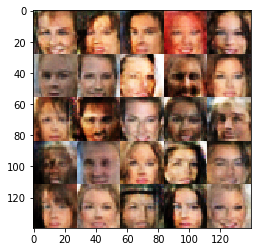

epoch 1/1... steps:8220  discriminator_loss: 1.1259... generator_loss: 1.2750
epoch 1/1... steps:8240  discriminator_loss: 0.7152... generator_loss: 1.3625
epoch 1/1... steps:8260  discriminator_loss: 0.6864... generator_loss: 1.3082
epoch 1/1... steps:8280  discriminator_loss: 0.7665... generator_loss: 2.5054
epoch 1/1... steps:8300  discriminator_loss: 1.3226... generator_loss: 0.5149


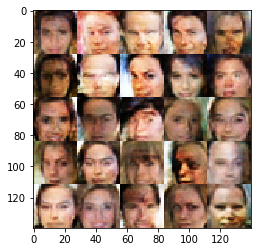

epoch 1/1... steps:8320  discriminator_loss: 0.9413... generator_loss: 1.6397
epoch 1/1... steps:8340  discriminator_loss: 0.8947... generator_loss: 1.2660
epoch 1/1... steps:8360  discriminator_loss: 0.6420... generator_loss: 1.5881
epoch 1/1... steps:8380  discriminator_loss: 0.7674... generator_loss: 2.2389
epoch 1/1... steps:8400  discriminator_loss: 0.6656... generator_loss: 2.2271


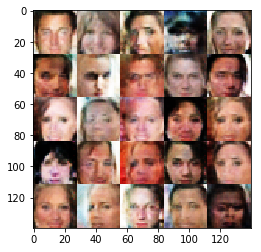

epoch 1/1... steps:8420  discriminator_loss: 0.9781... generator_loss: 2.9327
epoch 1/1... steps:8440  discriminator_loss: 1.1139... generator_loss: 1.1566
epoch 1/1... steps:8460  discriminator_loss: 1.2781... generator_loss: 0.5609
epoch 1/1... steps:8480  discriminator_loss: 1.0667... generator_loss: 1.0354
epoch 1/1... steps:8500  discriminator_loss: 1.0845... generator_loss: 0.7311


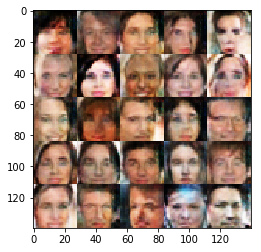

epoch 1/1... steps:8520  discriminator_loss: 1.1143... generator_loss: 0.7280
epoch 1/1... steps:8540  discriminator_loss: 1.1887... generator_loss: 1.7273
epoch 1/1... steps:8560  discriminator_loss: 1.1786... generator_loss: 3.8350
epoch 1/1... steps:8580  discriminator_loss: 1.1479... generator_loss: 0.6194
epoch 1/1... steps:8600  discriminator_loss: 1.2274... generator_loss: 0.8238


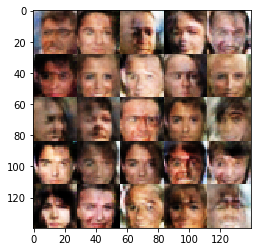

epoch 1/1... steps:8620  discriminator_loss: 0.7569... generator_loss: 1.4857
epoch 1/1... steps:8640  discriminator_loss: 1.6300... generator_loss: 0.3441
epoch 1/1... steps:8660  discriminator_loss: 1.0666... generator_loss: 2.0880
epoch 1/1... steps:8680  discriminator_loss: 0.9479... generator_loss: 1.0086
epoch 1/1... steps:8700  discriminator_loss: 1.5807... generator_loss: 0.4976


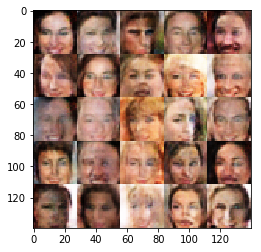

epoch 1/1... steps:8720  discriminator_loss: 0.7080... generator_loss: 1.2708
epoch 1/1... steps:8740  discriminator_loss: 1.0343... generator_loss: 0.7439
epoch 1/1... steps:8760  discriminator_loss: 0.6060... generator_loss: 2.2853
epoch 1/1... steps:8780  discriminator_loss: 0.5127... generator_loss: 2.1246
epoch 1/1... steps:8800  discriminator_loss: 1.4816... generator_loss: 3.0487


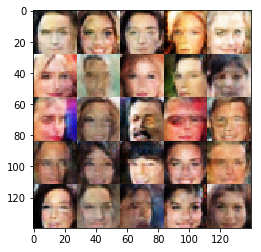

epoch 1/1... steps:8820  discriminator_loss: 0.8952... generator_loss: 1.1760
epoch 1/1... steps:8840  discriminator_loss: 1.2256... generator_loss: 0.7218
epoch 1/1... steps:8860  discriminator_loss: 0.9510... generator_loss: 0.9610
epoch 1/1... steps:8880  discriminator_loss: 0.5250... generator_loss: 2.0150
epoch 1/1... steps:8900  discriminator_loss: 0.8990... generator_loss: 1.3428


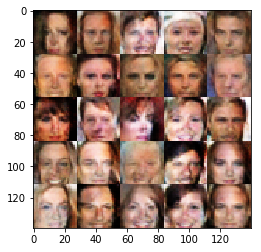

epoch 1/1... steps:8920  discriminator_loss: 0.7312... generator_loss: 1.2616
epoch 1/1... steps:8940  discriminator_loss: 0.8316... generator_loss: 1.4272
epoch 1/1... steps:8960  discriminator_loss: 0.9295... generator_loss: 1.4378
epoch 1/1... steps:8980  discriminator_loss: 0.8157... generator_loss: 1.0606
epoch 1/1... steps:9000  discriminator_loss: 1.3364... generator_loss: 0.5059


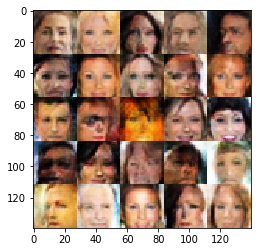

epoch 1/1... steps:9020  discriminator_loss: 0.7372... generator_loss: 1.3159
epoch 1/1... steps:9040  discriminator_loss: 1.0330... generator_loss: 0.9563
epoch 1/1... steps:9060  discriminator_loss: 0.7678... generator_loss: 1.8040
epoch 1/1... steps:9080  discriminator_loss: 0.5123... generator_loss: 2.8381
epoch 1/1... steps:9100  discriminator_loss: 0.5483... generator_loss: 2.4601


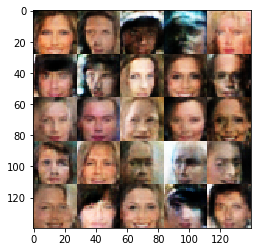

epoch 1/1... steps:9120  discriminator_loss: 1.0949... generator_loss: 0.8649
epoch 1/1... steps:9140  discriminator_loss: 1.0329... generator_loss: 0.7629
epoch 1/1... steps:9160  discriminator_loss: 2.5149... generator_loss: 0.1777
epoch 1/1... steps:9180  discriminator_loss: 1.1408... generator_loss: 0.6806
epoch 1/1... steps:9200  discriminator_loss: 1.1557... generator_loss: 0.6558


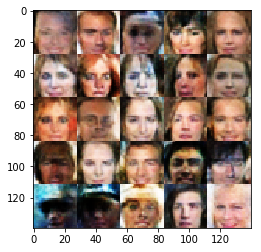

epoch 1/1... steps:9220  discriminator_loss: 0.7745... generator_loss: 1.2063
epoch 1/1... steps:9240  discriminator_loss: 0.6294... generator_loss: 1.4483
epoch 1/1... steps:9260  discriminator_loss: 0.5903... generator_loss: 2.0515
epoch 1/1... steps:9280  discriminator_loss: 0.9169... generator_loss: 3.5457
epoch 1/1... steps:9300  discriminator_loss: 0.7012... generator_loss: 1.6812


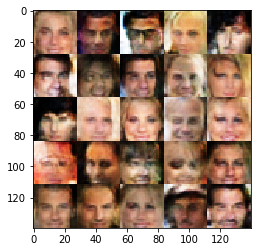

epoch 1/1... steps:9320  discriminator_loss: 2.3246... generator_loss: 3.1525
epoch 1/1... steps:9340  discriminator_loss: 0.6981... generator_loss: 1.2273
epoch 1/1... steps:9360  discriminator_loss: 1.0915... generator_loss: 0.7173
epoch 1/1... steps:9380  discriminator_loss: 1.0527... generator_loss: 1.0052
epoch 1/1... steps:9400  discriminator_loss: 1.0351... generator_loss: 0.7891


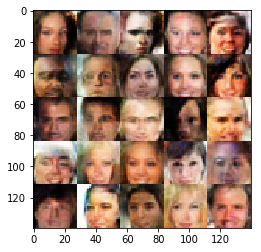

epoch 1/1... steps:9420  discriminator_loss: 0.7024... generator_loss: 1.3129
epoch 1/1... steps:9440  discriminator_loss: 0.8432... generator_loss: 1.0288
epoch 1/1... steps:9460  discriminator_loss: 0.8958... generator_loss: 3.1306
epoch 1/1... steps:9480  discriminator_loss: 0.4949... generator_loss: 2.1176
epoch 1/1... steps:9500  discriminator_loss: 1.0994... generator_loss: 0.6742


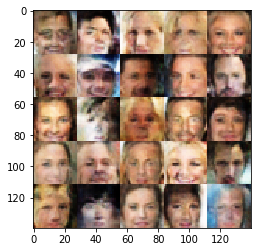

epoch 1/1... steps:9520  discriminator_loss: 0.7324... generator_loss: 2.7460
epoch 1/1... steps:9540  discriminator_loss: 0.6826... generator_loss: 1.4652
epoch 1/1... steps:9560  discriminator_loss: 0.4523... generator_loss: 3.1006
epoch 1/1... steps:9580  discriminator_loss: 1.0743... generator_loss: 0.9352
epoch 1/1... steps:9600  discriminator_loss: 0.9891... generator_loss: 1.2242


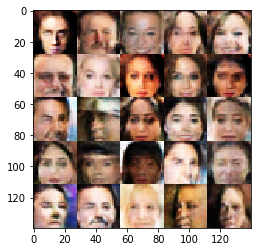

epoch 1/1... steps:9620  discriminator_loss: 0.6107... generator_loss: 3.0179
epoch 1/1... steps:9640  discriminator_loss: 0.7516... generator_loss: 1.4302
epoch 1/1... steps:9660  discriminator_loss: 0.6987... generator_loss: 1.3856
epoch 1/1... steps:9680  discriminator_loss: 0.3840... generator_loss: 3.6379
epoch 1/1... steps:9700  discriminator_loss: 0.4758... generator_loss: 3.8393


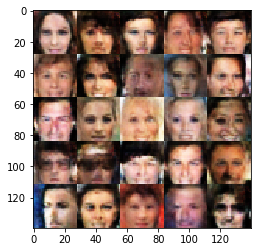

epoch 1/1... steps:9720  discriminator_loss: 1.0437... generator_loss: 3.9517
epoch 1/1... steps:9740  discriminator_loss: 0.6582... generator_loss: 3.5579
epoch 1/1... steps:9760  discriminator_loss: 0.8470... generator_loss: 1.0646
epoch 1/1... steps:9780  discriminator_loss: 1.3321... generator_loss: 2.1707
epoch 1/1... steps:9800  discriminator_loss: 1.1435... generator_loss: 0.6662


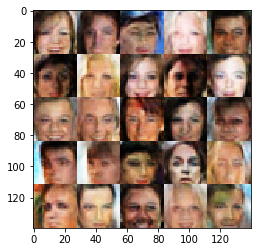

epoch 1/1... steps:9820  discriminator_loss: 0.5886... generator_loss: 1.6198
epoch 1/1... steps:9840  discriminator_loss: 0.5299... generator_loss: 1.9790
epoch 1/1... steps:9860  discriminator_loss: 0.8874... generator_loss: 1.0045
epoch 1/1... steps:9880  discriminator_loss: 0.8971... generator_loss: 1.0450
epoch 1/1... steps:9900  discriminator_loss: 0.7970... generator_loss: 2.7360


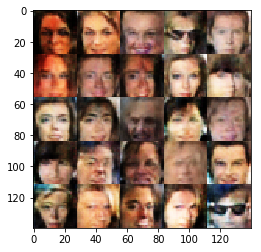

epoch 1/1... steps:9920  discriminator_loss: 0.4526... generator_loss: 2.4676
epoch 1/1... steps:9940  discriminator_loss: 0.7486... generator_loss: 2.8511
epoch 1/1... steps:9960  discriminator_loss: 0.8672... generator_loss: 1.0663
epoch 1/1... steps:9980  discriminator_loss: 0.9311... generator_loss: 0.9203
epoch 1/1... steps:10000  discriminator_loss: 0.4471... generator_loss: 2.5742


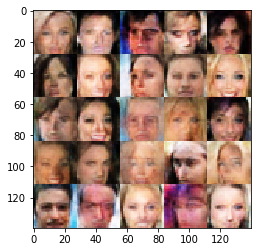

epoch 1/1... steps:10020  discriminator_loss: 0.8282... generator_loss: 1.0549
epoch 1/1... steps:10040  discriminator_loss: 0.4950... generator_loss: 2.7643
epoch 1/1... steps:10060  discriminator_loss: 0.4218... generator_loss: 3.2462
epoch 1/1... steps:10080  discriminator_loss: 0.5494... generator_loss: 1.9676
epoch 1/1... steps:10100  discriminator_loss: 1.1748... generator_loss: 2.8107


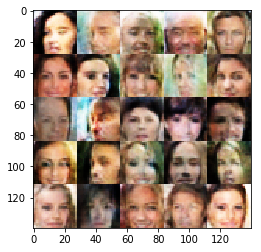

epoch 1/1... steps:10120  discriminator_loss: 0.6924... generator_loss: 1.3721
final discriminator_loss: 0.6924... generator_oss: 1.3721


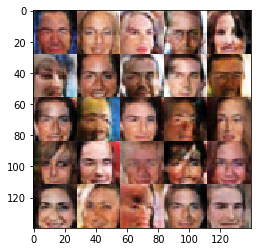

In [14]:
batch_size = 20
z_dim = 20
learning_rate = 0.0004
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.